In [1]:
import pandas as pd

In [2]:
meta_data = pd.read_csv('../../../For_analysis/RNASequencing/IR3/metaDataIR3.csv')
meta_data

,HudAlphaID,QCflagIR3,Specimen Bar Code,PATNO,GENDER,DIAGNOSIS,CLINICAL_EVENT,Specimen Bar Code.1,Quantity (ug),Concentration (ng/ul),...,MEDIAN_3PRIME_BIAS,NUM_UNEXPLAINED_READS,PCT_RIBOSOMAL_BASES,PCT_INTRONIC_BASES,PCT_R2_TRANSCRIPT_STRAND_READS,PCT_MRNA_BASES,MEDIAN_5PRIME_TO_3PRIME_BIAS,PCT_R1_TRANSCRIPT_STRAND_READS,MEDIAN_5PRIME_BIAS,PCT_USABLE_BASES
0,5104-SL-0001,pass,0000373111,3174,Male,PD,V08,0000373111,1.0,115.90,...,0.845235,1093161,0.0,43.4564,98.1025,50.4726,1.191875,1.8975,1.019442,47.9359
1,5104-SL-0002,pass,PP0016-0526,3201,Female,Control,BL,PP0016-0526,1.0,80.07,...,0.913436,569224,0.0,52.9752,98.1428,40.6987,1.058616,1.8572,0.965040,39.6130
2,5104-SL-0003,pass,0003125874,3057,Female,Control,V06,0003125874,1.0,219.70,...,0.902573,485102,0.0,52.2706,95.4321,36.0884,1.095971,4.5679,0.997003,34.8096
3,5104-SL-0004,pass,0003179818,4126,Male,PD,V04,0003179818,1.0,100.06,...,0.856690,1145227,0.0,45.9355,98.3785,48.3407,1.170152,1.6215,1.013765,45.3119
4,5104-SL-0005,pass,0003164601,4117,Female,PD,BL,0003164601,1.0,124.40,...,0.894656,461631,0.0,58.3984,98.0678,35.8255,1.113733,1.9322,0.985280,34.8793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4866,5104-SL-4890,pass,0003314545,41314,Female,Genetic Cohort,V02,0003314545,1.0,105.10,...,0.707867,1097837,0.0,41.6055,92.5357,40.2167,1.526826,7.4643,1.086717,36.7253
4867,5104-SL-4891,pass,0003376702,42308,Male,Genetic Cohort,V02,0003376702,1.0,56.09,...,0.719713,775420,0.0,47.0490,97.3024,38.8043,1.269003,2.6976,0.946045,35.5802
4868,5104-SL-4892,pass,0003376763,42306,Male,Genetic Cohort,V02,0003376763,1.0,59.68,...,0.736184,794163,0.0,49.0178,97.0378,38.4877,1.300012,2.9622,0.995326,35.4419
4869,5104-SL-4893,pass,0003203630,1010,Unk,HCPOOL,Unk,0003203630,1.0,50.00,...,0.707379,748803,0.0,40.0865,95.8621,44.4177,1.479038,4.1379,1.031890,41.3555


In [3]:
meta_data.columns

Index(['HudAlphaID', 'QCflagIR3', 'Specimen Bar Code', 'PATNO', 'GENDER',
       'DIAGNOSIS', 'CLINICAL_EVENT', 'Specimen Bar Code.1', 'Quantity (ug)',
       'Concentration (ng/ul)', 'Concentration Flag', 'Submitted Volume (ul)',
       'Normalization Volume (30ng/ul)', 'Total Volume (ul)',
       'Input RNASeq (ng)', 'Input miRNA (ng)', '260/280 Ratio',
       '260/230 Ratio', 'RIN Value', 'BOX', 'POSITION', 'Plate', 'Sample',
       'deletion_length', 'insertion_length', 'mismatch_rate',
       'multimapped_percent', 'uniquely_mapped_percent',
       'num_annotated_splices', 'insertion_rate', 'unmapped_other_percent',
       'multimapped', 'num_splices', 'avg_input_read_length',
       'multimapped_toomany', 'total_reads', 'num_GCAG_splices',
       'unmapped_tooshort', 'unmapped_other', 'unmapped_mismatches_percent',
       'num_noncanonical_splices', 'num_ATAC_splices',
       'multimapped_toomany_percent', 'avg_mapped_read_length',
       'unmapped_mismatches', 'deletion_rate', '

In [4]:
meta_data.PATNO.value_counts()

PATNO
1010     53
1009     53
4104      5
3229      5
3214      5
         ..
42349     1
42298     1
42305     1
42431     1
42312     1
Name: count, Length: 1603, dtype: int64

In [5]:
disease_df = meta_data[['PATNO','DIAGNOSIS']].drop_duplicates()

In [6]:
disease_df.DIAGNOSIS.value_counts()

DIAGNOSIS
Genetic Registry    435
PD                  425
Genetic Cohort      418
Control             196
Prodromal            64
SWEDD                63
PDPOOL                1
HCPOOL                1
Name: count, dtype: int64

In [7]:
import os

In [8]:
l = 0
for i in os.listdir('../../../For_analysis/RNASequencing/IR3/quant/'):
    l = l + 1
    print(i)
    if l==3:
        break

PPMI-Phase2-IR3.3813.V02.PP0013-6148.5104-SL-4635.longRNA-NEBKAP.salmon.genes.sf
PPMI-Phase2-IR3.3481.BL.0003119333.5104-SL-0197.longRNA-NEBKAP.salmon.genes.sf
PPMI-Phase1-IR3.18567.BL.0000302585.5104-SL-1516.longRNA-NEBKAP.salmon.genes.sf


In [9]:
481in meta_data.PATNO.values

<>:1: SyntaxWarning: invalid decimal literal
<>:1: SyntaxWarning: invalid decimal literal
/tmp/ipykernel_164465/1253600030.py:1: SyntaxWarning: invalid decimal literal
  481in meta_data.PATNO.values


False

In [10]:
gene_excel = pd.ExcelFile('/12tb_dsk3/For_analysis/PD genes.xlsx')


In [11]:
df2 = pd.read_excel(gene_excel, 'Gene_List_Lancet')
##df1 = pd.read_excel(gene_excel, 'Integrated stress response')

In [12]:
df2

,Nearest Gene
0,ASXL3
1,BAG3
2,BIN3
3,BRIP1
4,BST1
...,...
85,UBAP2
86,UBTF
87,VAMP4
88,VPS13C


In [13]:
gene_list = df2['Nearest Gene'].tolist()

In [14]:
import numpy as np
for i in range(100):
    try:
        gene_list.remove(np.nan) # run 4 times
    except:
        break

In [15]:
gene_list = [i.strip() for i in gene_list]

In [16]:
gene_list

['ASXL3',
 'BAG3',
 'BIN3',
 'BRIP1',
 'BST1',
 'C5orf24',
 'CAB39L',
 'CAMK2D',
 'CASC16',
 'CD19',
 'CHD9',
 'CHRNB1',
 'CLCN3',
 'CRHR1',
 'CRHR1',
 'CRLS1',
 'CTSB',
 'DLG2',
 'DNAH17',
 'DYRK1A',
 'ELOVL7',
 'FAM171A2',
 'FAM47E',
 'FAM47E-STBD1',
 'FAM49B',
 'FBRSL1',
 'FCGR2A',
 'FGF20',
 'FYN',
 'GAK',
 'GALC',
 'GBAP1',
 'GBF1',
 'GCH1',
 'GPNMB',
 'GS1-124K5.11',
 'HIP1R',
 'HLA-DRB5',
 'IGSF9B',
 'INPP5F',
 'IP6K2',
 'ITGA8',
 'ITPKB',
 'KCNIP3',
 'KCNS3',
 'KPNA1',
 'KRTCAP2',
 'LCORL',
 'LINC00693',
 'LOC100131289',
 'LRRK2',
 'LRRK2',
 'MAP4K4',
 'MBNL2',
 'MCCC1',
 'MED12L',
 'MEX3C',
 'MIPOL1',
 'NOD2',
 'NUCKS1',
 'PAM',
 'PMVK',
 'RAB29',
 'RETREG3',
 'RIMS1',
 'RIT2',
 'RNF141',
 'RPS12',
 'RPS6KL1',
 'SATB1',
 'SCAF11',
 'SCARB2',
 'SETD1A',
 'SH3GL2',
 'SH3GL2',
 'SIPA1L2',
 'SNCA',
 'SNCA',
 'SPPL2B',
 'SPTSSB',
 'STK39',
 'SYT17',
 'TMEM163',
 'TMEM175',
 'TRIM40',
 'UBAP2',
 'UBTF',
 'VAMP4',
 'VPS13C',
 'WNT3']

In [17]:
gene_list = set(gene_list)

In [18]:
len(gene_list )

86

In [19]:

from pybiomart import Server

# Connect to the Ensembl server
server = Server(host='http://www.ensembl.org')
dataset = server.marts['ENSEMBL_MART_ENSEMBL'].datasets['hsapiens_gene_ensembl']  # Replace with your organism

# Query for gene names and Ensembl IDs
# Replace 'BRCA1' with your gene of interest or a list of genes
genes_of_interest = gene_list
query_results = dataset.query(attributes=['external_gene_name', 'ensembl_gene_id'])

# Filter results for your genes of interest
results = query_results[query_results['Gene name'].isin(genes_of_interest)]
print(results)

      Gene name   Gene stable ID
1308     CAB39L  ENSG00000102547
1626     CHRNB1  ENSG00000283946
1765       RIT2  ENSG00000152214
2524     DYRK1A  ENSG00000157540
2928      MEX3C  ENSG00000176624
...         ...              ...
73375      CTSB  ENSG00000164733
81483    FCGR2A  ENSG00000143226
83487      PMVK  ENSG00000163344
83526    NUCKS1  ENSG00000069275
83528     RAB29  ENSG00000117280

[94 rows x 2 columns]


In [20]:
len(results)

94

In [21]:
set(gene_list) - set(results['Gene name'].tolist())

{'FAM49B', 'GBAP1', 'GS1-124K5.11', 'LINC00693', 'LOC100131289'}

In [22]:
#'FAM49B': ENSG00000153310 
# ENSG00000160766

In [23]:
keep_genes = results['Gene stable ID'].tolist()

In [24]:
keep_genes.append('ENSG00000153310')

In [25]:
sample_3813 = pd.read_csv('../../../For_analysis/RNASequencing/IR3/quant/PPMI-Phase2-IR3.3813.V02.PP0013-6148.5104-SL-4635.longRNA-NEBKAP.salmon.genes.sf' ,sep = '\t')
m = [i.split('.')[0] for i in sample_3813.Name.tolist()]

In [26]:
keep_genes = list(set(m).intersection(keep_genes))

In [27]:
len(keep_genes)

82

In [28]:
l = 0
from tqdm import tqdm
data = pd.DataFrame(columns=keep_genes)
for i in tqdm(os.listdir('../../../For_analysis/RNASequencing/IR3/quant/')):
    if 'genes' not in i:
        continue
    
    read_file_path = '../../../For_analysis/RNASequencing/IR3/quant/'+ str(i)
    df = pd.read_csv(read_file_path ,sep = '\t')
    #print(df.head())
    m = [i.split('.')[0] for i in df.Name.tolist()]
    df['Name'] = m 
    df = df.rename(columns={'TPM': i})
    #print(df.head())
    df = df.set_index('Name')[[i]].T
    
    df = df[keep_genes]
    #print(df.head())
    data = pd.concat([data,df])


  0%|                                                                                                                                         | 0/9513 [00:00<?, ?it/s]/tmp/ipykernel_164465/3419326005.py:19: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  data = pd.concat([data,df])
100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9513/9513 [02:16<00:00, 69.45it/s]


In [29]:
data.sort_index()

,ENSG00000198648,ENSG00000152128,ENSG00000129003,ENSG00000107862,ENSG00000088766,ENSG00000178950,ENSG00000069275,ENSG00000109572,ENSG00000078070,ENSG00000167207,...,ENSG00000187775,ENSG00000157540,ENSG00000272414,ENSG00000010810,ENSG00000139793,ENSG00000120088,ENSG00000103528,ENSG00000005206,ENSG00000080854,ENSG00000077943
PPMI-Phase1-IR3.1009.POOL.0003202425.5104-SL-0095.longRNA-NEBKAP.salmon.genes.sf,15.77920,0.357154,68.0320,7.76369,29.5960,55.50060,14.50140,16.0707,16.88680,29.4311,...,0.200293,97.9972,0.312008,272.8540,10.18530,0.150721,1.205240,14.58880,4.984830,0.075216
PPMI-Phase1-IR3.1009.POOL.0003202427.5104-SL-0287.longRNA-NEBKAP.salmon.genes.sf,7.33804,0.163117,43.7002,2.78193,19.9305,16.82930,12.50460,10.5714,8.21090,15.5076,...,0.159603,63.4053,0.200028,121.7550,5.75805,0.259785,0.622573,4.13228,1.098740,0.063795
PPMI-Phase1-IR3.1009.POOL.0003202429.5104-SL-0479.longRNA-NEBKAP.salmon.genes.sf,10.80760,0.164827,50.6662,4.65644,24.0900,22.08110,19.09390,14.1403,11.24690,21.5583,...,0.135381,87.2531,0.244119,180.4950,9.40022,0.109346,1.000710,6.13890,1.775570,0.035912
PPMI-Phase1-IR3.1009.POOL.0003202431.5104-SL-0671.longRNA-NEBKAP.salmon.genes.sf,8.16016,0.220818,48.6334,4.51892,22.1994,21.28660,18.16080,13.8498,9.35643,17.5518,...,0.241733,82.1095,0.121763,154.1590,8.73068,0.161904,0.912199,5.53179,1.824850,0.120375
PPMI-Phase1-IR3.1009.POOL.0003202432.5104-SL-0767.longRNA-NEBKAP.salmon.genes.sf,10.49950,0.236232,58.6103,4.06196,25.5024,18.78710,18.01060,15.5167,13.14970,22.0287,...,0.058540,88.4979,0.278582,171.5020,9.73941,0.154282,0.856608,5.62752,1.278200,0.031044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PPMI-Phase2-IR3.92490.V02.0000377639.5104-SL-2827.longRNA-NEBKAP.salmon.genes.sf,1.95775,0.081500,30.8916,2.37649,15.6400,13.82490,8.14183,7.3131,6.97230,20.8244,...,0.146413,54.5351,0.100909,46.4139,6.20654,0.000000,0.499208,4.61932,0.524276,0.023387
PPMI-Phase2-IR3.92490.V04.0001176681.5104-SL-2875.longRNA-NEBKAP.salmon.genes.sf,5.33429,0.185657,43.9281,5.61909,17.2731,37.62860,11.00280,13.1167,10.21820,32.1520,...,0.183987,73.4215,0.197967,91.4449,6.58722,0.030825,0.943298,8.04972,1.653940,0.031372
PPMI-Phase2-IR3.92490.V06.0003173298.5104-SL-2868.longRNA-NEBKAP.salmon.genes.sf,4.56989,0.321592,44.5156,5.56125,19.7806,36.31410,12.26750,13.8186,9.41808,34.9917,...,0.253691,74.9874,0.407272,107.1330,7.70404,0.029808,0.733679,8.41185,0.612554,0.029659
PPMI-Phase2-IR3.92834.V02.0001093148.5104-SL-4064.longRNA-NEBKAP.salmon.genes.sf,3.97802,0.200748,37.0995,2.85196,17.1601,12.87110,9.85164,16.9019,6.77780,19.0264,...,0.071000,69.3384,0.029529,73.0536,7.09393,0.006405,0.178958,3.03483,0.908311,0.080995


In [30]:
meta_data

,HudAlphaID,QCflagIR3,Specimen Bar Code,PATNO,GENDER,DIAGNOSIS,CLINICAL_EVENT,Specimen Bar Code.1,Quantity (ug),Concentration (ng/ul),...,MEDIAN_3PRIME_BIAS,NUM_UNEXPLAINED_READS,PCT_RIBOSOMAL_BASES,PCT_INTRONIC_BASES,PCT_R2_TRANSCRIPT_STRAND_READS,PCT_MRNA_BASES,MEDIAN_5PRIME_TO_3PRIME_BIAS,PCT_R1_TRANSCRIPT_STRAND_READS,MEDIAN_5PRIME_BIAS,PCT_USABLE_BASES
0,5104-SL-0001,pass,0000373111,3174,Male,PD,V08,0000373111,1.0,115.90,...,0.845235,1093161,0.0,43.4564,98.1025,50.4726,1.191875,1.8975,1.019442,47.9359
1,5104-SL-0002,pass,PP0016-0526,3201,Female,Control,BL,PP0016-0526,1.0,80.07,...,0.913436,569224,0.0,52.9752,98.1428,40.6987,1.058616,1.8572,0.965040,39.6130
2,5104-SL-0003,pass,0003125874,3057,Female,Control,V06,0003125874,1.0,219.70,...,0.902573,485102,0.0,52.2706,95.4321,36.0884,1.095971,4.5679,0.997003,34.8096
3,5104-SL-0004,pass,0003179818,4126,Male,PD,V04,0003179818,1.0,100.06,...,0.856690,1145227,0.0,45.9355,98.3785,48.3407,1.170152,1.6215,1.013765,45.3119
4,5104-SL-0005,pass,0003164601,4117,Female,PD,BL,0003164601,1.0,124.40,...,0.894656,461631,0.0,58.3984,98.0678,35.8255,1.113733,1.9322,0.985280,34.8793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4866,5104-SL-4890,pass,0003314545,41314,Female,Genetic Cohort,V02,0003314545,1.0,105.10,...,0.707867,1097837,0.0,41.6055,92.5357,40.2167,1.526826,7.4643,1.086717,36.7253
4867,5104-SL-4891,pass,0003376702,42308,Male,Genetic Cohort,V02,0003376702,1.0,56.09,...,0.719713,775420,0.0,47.0490,97.3024,38.8043,1.269003,2.6976,0.946045,35.5802
4868,5104-SL-4892,pass,0003376763,42306,Male,Genetic Cohort,V02,0003376763,1.0,59.68,...,0.736184,794163,0.0,49.0178,97.0378,38.4877,1.300012,2.9622,0.995326,35.4419
4869,5104-SL-4893,pass,0003203630,1010,Unk,HCPOOL,Unk,0003203630,1.0,50.00,...,0.707379,748803,0.0,40.0865,95.8621,44.4177,1.479038,4.1379,1.031890,41.3555


In [31]:
l = data.index.tolist()
patient_no = [i.split('.')[1] for i in l]
time_point = [i.split('.')[2] for i in l]

In [32]:
data['Patient_Name'] = patient_no 
data['Time_Point'] = time_point

In [33]:
col_index= ['Patient_Name',
 'Time_Point']+ data.columns.tolist()[0:-2]

In [34]:
data = data[col_index]

In [35]:
data = data.sort_values(by = 'Patient_Name', axis = 0)

In [36]:
data

,Patient_Name,Time_Point,ENSG00000198648,ENSG00000152128,ENSG00000129003,ENSG00000107862,ENSG00000088766,ENSG00000178950,ENSG00000069275,ENSG00000109572,...,ENSG00000187775,ENSG00000157540,ENSG00000272414,ENSG00000010810,ENSG00000139793,ENSG00000120088,ENSG00000103528,ENSG00000005206,ENSG00000080854,ENSG00000077943
PPMI-Phase1-IR3.1009.POOL.0003202438.5104-SL-1343.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,8.95014,0.263306,48.43210,4.50553,22.58820,21.91660,14.81610,13.43420,...,0.259032,76.1498,0.280150,158.5650,8.52919,0.809307,0.798627,6.16641,2.046420,0.041491
PPMI-Phase1-IR3.1009.POOL.0003202431.5104-SL-0671.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,8.16016,0.220818,48.63340,4.51892,22.19940,21.28660,18.16080,13.84980,...,0.241733,82.1095,0.121763,154.1590,8.73068,0.161904,0.912199,5.53179,1.824850,0.120375
PPMI-Phase2-IR3.1009.POOL.0003203727.5104-SL-4014.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,9.02967,0.363028,57.92050,4.50494,25.16920,26.35990,17.85680,14.97240,...,0.213862,85.7193,0.272722,176.2740,9.22947,0.038518,1.144400,7.71519,1.710160,0.154993
PPMI-Phase2-IR3.1009.POOL.0003202434.5104-SL-0959.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,3.24941,0.129916,23.45790,1.56676,12.37960,9.68397,6.80878,6.87623,...,0.120768,33.4360,0.119024,66.1530,3.58702,0.057009,0.396962,2.47809,0.507145,0.021066
PPMI-Phase1-IR3.1009.POOL.0003202442.5104-SL-1719.longRNA-NEBKAP.salmon.genes.sf,1009,POOL,8.53222,0.313859,50.54030,3.96128,25.14300,20.46490,19.96060,13.75990,...,0.204085,84.6036,0.262254,158.4890,8.56002,0.047461,1.071910,7.23957,1.840870,0.060562
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PPMI-Phase2-IR3.92490.V06.0003173298.5104-SL-2868.longRNA-NEBKAP.salmon.genes.sf,92490,V06,4.56989,0.321592,44.51560,5.56125,19.78060,36.31410,12.26750,13.81860,...,0.253691,74.9874,0.407272,107.1330,7.70404,0.029808,0.733679,8.41185,0.612554,0.029659
PPMI-Phase2-IR3.92490.V02.0000377639.5104-SL-2827.longRNA-NEBKAP.salmon.genes.sf,92490,V02,1.95775,0.081500,30.89160,2.37649,15.64000,13.82490,8.14183,7.31310,...,0.146413,54.5351,0.100909,46.4139,6.20654,0.000000,0.499208,4.61932,0.524276,0.023387
PPMI-Phase1-IR3.92834.BL.0000286784.5104-SL-0950.longRNA-NEBKAP.salmon.genes.sf,92834,BL,1.02809,0.045127,8.00855,1.05128,5.21408,6.30230,3.78201,6.41030,...,0.002013,17.3711,0.041221,18.4427,2.30723,0.000000,0.027908,1.12343,0.279503,0.002961
PPMI-Phase2-IR3.92834.V02.0001093148.5104-SL-4064.longRNA-NEBKAP.salmon.genes.sf,92834,V02,3.97802,0.200748,37.09950,2.85196,17.16010,12.87110,9.85164,16.90190,...,0.071000,69.3384,0.029529,73.0536,7.09393,0.006405,0.178958,3.03483,0.908311,0.080995


In [37]:
temp_meta = meta_data[['PATNO','DIAGNOSIS']].drop_duplicates()

In [38]:
temp_meta.PATNO = temp_meta.PATNO.astype(str)

In [39]:
data = pd.merge(data,temp_meta, left_on = 'Patient_Name', right_on = 'PATNO')

In [40]:
keep_columns = ['DIAGNOSIS'] + data.columns.tolist()[0:-2]

In [41]:
data = data[keep_columns]

In [42]:
data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000198648,ENSG00000152128,ENSG00000129003,ENSG00000107862,ENSG00000088766,ENSG00000178950,ENSG00000069275,...,ENSG00000187775,ENSG00000157540,ENSG00000272414,ENSG00000010810,ENSG00000139793,ENSG00000120088,ENSG00000103528,ENSG00000005206,ENSG00000080854,ENSG00000077943
0,PDPOOL,1009,POOL,8.95014,0.263306,48.43210,4.50553,22.58820,21.91660,14.81610,...,0.259032,76.1498,0.280150,158.5650,8.52919,0.809307,0.798627,6.16641,2.046420,0.041491
1,PDPOOL,1009,POOL,8.16016,0.220818,48.63340,4.51892,22.19940,21.28660,18.16080,...,0.241733,82.1095,0.121763,154.1590,8.73068,0.161904,0.912199,5.53179,1.824850,0.120375
2,PDPOOL,1009,POOL,9.02967,0.363028,57.92050,4.50494,25.16920,26.35990,17.85680,...,0.213862,85.7193,0.272722,176.2740,9.22947,0.038518,1.144400,7.71519,1.710160,0.154993
3,PDPOOL,1009,POOL,3.24941,0.129916,23.45790,1.56676,12.37960,9.68397,6.80878,...,0.120768,33.4360,0.119024,66.1530,3.58702,0.057009,0.396962,2.47809,0.507145,0.021066
4,PDPOOL,1009,POOL,8.53222,0.313859,50.54030,3.96128,25.14300,20.46490,19.96060,...,0.204085,84.6036,0.262254,158.4890,8.56002,0.047461,1.071910,7.23957,1.840870,0.060562
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4739,Prodromal,92490,V06,4.56989,0.321592,44.51560,5.56125,19.78060,36.31410,12.26750,...,0.253691,74.9874,0.407272,107.1330,7.70404,0.029808,0.733679,8.41185,0.612554,0.029659
4740,Prodromal,92490,V02,1.95775,0.081500,30.89160,2.37649,15.64000,13.82490,8.14183,...,0.146413,54.5351,0.100909,46.4139,6.20654,0.000000,0.499208,4.61932,0.524276,0.023387
4741,Prodromal,92834,BL,1.02809,0.045127,8.00855,1.05128,5.21408,6.30230,3.78201,...,0.002013,17.3711,0.041221,18.4427,2.30723,0.000000,0.027908,1.12343,0.279503,0.002961
4742,Prodromal,92834,V02,3.97802,0.200748,37.09950,2.85196,17.16010,12.87110,9.85164,...,0.071000,69.3384,0.029529,73.0536,7.09393,0.006405,0.178958,3.03483,0.908311,0.080995


In [43]:
data = data[data.DIAGNOSIS.isin(['PD','Control','Prodromal'])]

In [44]:
data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000198648,ENSG00000152128,ENSG00000129003,ENSG00000107862,ENSG00000088766,ENSG00000178950,ENSG00000069275,...,ENSG00000187775,ENSG00000157540,ENSG00000272414,ENSG00000010810,ENSG00000139793,ENSG00000120088,ENSG00000103528,ENSG00000005206,ENSG00000080854,ENSG00000077943
106,Prodromal,10874,V06,10.87660,0.110576,57.47330,4.93916,28.65710,20.73140,17.03590,...,0.073663,92.3417,0.073247,200.4140,11.88160,0.000000,0.564384,4.11410,1.434460,0.033180
107,Prodromal,10874,BL,7.17486,0.300970,57.87220,3.46756,23.83120,21.10000,20.80220,...,0.098424,79.4512,0.100245,155.2130,11.89630,0.502434,0.911058,6.07736,0.699274,0.059478
108,Prodromal,10874,V04,12.38740,0.136258,58.90900,6.09077,29.17390,34.15100,20.15610,...,0.136002,103.1640,0.214091,236.5010,11.75380,0.000000,1.130850,7.84089,1.775890,0.054680
109,Prodromal,10874,V02,13.28410,0.653297,57.45470,5.33714,29.88340,30.34870,21.06700,...,0.890102,101.2090,0.589156,246.5890,10.44220,0.309368,1.177630,8.44687,1.883930,0.258107
110,Prodromal,12224,V08,10.52120,0.515410,71.71000,4.18877,32.05180,19.42870,22.10510,...,0.450357,93.8333,0.521324,219.3820,13.39650,0.350550,1.135890,5.93398,2.428650,1.186400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4739,Prodromal,92490,V06,4.56989,0.321592,44.51560,5.56125,19.78060,36.31410,12.26750,...,0.253691,74.9874,0.407272,107.1330,7.70404,0.029808,0.733679,8.41185,0.612554,0.029659
4740,Prodromal,92490,V02,1.95775,0.081500,30.89160,2.37649,15.64000,13.82490,8.14183,...,0.146413,54.5351,0.100909,46.4139,6.20654,0.000000,0.499208,4.61932,0.524276,0.023387
4741,Prodromal,92834,BL,1.02809,0.045127,8.00855,1.05128,5.21408,6.30230,3.78201,...,0.002013,17.3711,0.041221,18.4427,2.30723,0.000000,0.027908,1.12343,0.279503,0.002961
4742,Prodromal,92834,V02,3.97802,0.200748,37.09950,2.85196,17.16010,12.87110,9.85164,...,0.071000,69.3384,0.029529,73.0536,7.09393,0.006405,0.178958,3.03483,0.908311,0.080995


In [45]:
data.to_csv('/12tb_dsk3/For_analysis/count_matrix_per_gene_list/LANCET_PD_Genes_expression.csv', index=False)

In [46]:
data.columns

Index(['DIAGNOSIS', 'Patient_Name', 'Time_Point', 'ENSG00000198648',
       'ENSG00000152128', 'ENSG00000129003', 'ENSG00000107862',
       'ENSG00000088766', 'ENSG00000178950', 'ENSG00000069275',
       'ENSG00000109572', 'ENSG00000078070', 'ENSG00000167207',
       'ENSG00000108379', 'ENSG00000163463', 'ENSG00000145335',
       'ENSG00000141431', 'ENSG00000130787', 'ENSG00000164733',
       'ENSG00000177200', 'ENSG00000078579', 'ENSG00000115041',
       'ENSG00000150672', 'ENSG00000109743', 'ENSG00000178177',
       'ENSG00000198208', 'ENSG00000102547', 'ENSG00000071054',
       'ENSG00000196542', 'ENSG00000107295', 'ENSG00000136235',
       'ENSG00000163344', 'ENSG00000189157', 'ENSG00000161682',
       'ENSG00000170175', 'ENSG00000164181', 'ENSG00000145349',
       'ENSG00000127419', 'ENSG00000249231', 'ENSG00000079841',
       'ENSG00000170745', 'ENSG00000136492', 'ENSG00000110315',
       'ENSG00000112306', 'ENSG00000181904', 'ENSG00000198502',
       'ENSG00000147439', 'ENSG0000

In [47]:
# comapring control vs all time

In [48]:
data.DIAGNOSIS.value_counts()

DIAGNOSIS
PD           1716
Control       869
Prodromal     254
Name: count, dtype: int64

In [49]:
Control_sample = data[data.DIAGNOSIS == 'Control']

In [50]:
Control_sample.Time_Point.value_counts()

Time_Point
BL     189
V04    179
V02    177
V06    165
V08    159
Name: count, dtype: int64

In [51]:
PD_sample = data[data.DIAGNOSIS == 'PD']
PD_sample.Time_Point.value_counts()

Time_Point
BL     393
V04    354
V06    352
V08    340
V02    277
Name: count, dtype: int64

In [52]:
Prodromal_sample = data[data.DIAGNOSIS == 'Prodromal']
Prodromal_sample.Time_Point.value_counts()

Time_Point
V04    59
V02    59
V06    58
BL     58
V08    20
Name: count, dtype: int64

In [53]:
Prodromal_sample = Prodromal_sample.reset_index(drop=True)
Prodromal_sample

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000198648,ENSG00000152128,ENSG00000129003,ENSG00000107862,ENSG00000088766,ENSG00000178950,ENSG00000069275,...,ENSG00000187775,ENSG00000157540,ENSG00000272414,ENSG00000010810,ENSG00000139793,ENSG00000120088,ENSG00000103528,ENSG00000005206,ENSG00000080854,ENSG00000077943
0,Prodromal,10874,V06,10.87660,0.110576,57.47330,4.93916,28.65710,20.73140,17.03590,...,0.073663,92.3417,0.073247,200.4140,11.88160,0.000000,0.564384,4.11410,1.434460,0.033180
1,Prodromal,10874,BL,7.17486,0.300970,57.87220,3.46756,23.83120,21.10000,20.80220,...,0.098424,79.4512,0.100245,155.2130,11.89630,0.502434,0.911058,6.07736,0.699274,0.059478
2,Prodromal,10874,V04,12.38740,0.136258,58.90900,6.09077,29.17390,34.15100,20.15610,...,0.136002,103.1640,0.214091,236.5010,11.75380,0.000000,1.130850,7.84089,1.775890,0.054680
3,Prodromal,10874,V02,13.28410,0.653297,57.45470,5.33714,29.88340,30.34870,21.06700,...,0.890102,101.2090,0.589156,246.5890,10.44220,0.309368,1.177630,8.44687,1.883930,0.258107
4,Prodromal,12224,V08,10.52120,0.515410,71.71000,4.18877,32.05180,19.42870,22.10510,...,0.450357,93.8333,0.521324,219.3820,13.39650,0.350550,1.135890,5.93398,2.428650,1.186400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
249,Prodromal,92490,V06,4.56989,0.321592,44.51560,5.56125,19.78060,36.31410,12.26750,...,0.253691,74.9874,0.407272,107.1330,7.70404,0.029808,0.733679,8.41185,0.612554,0.029659
250,Prodromal,92490,V02,1.95775,0.081500,30.89160,2.37649,15.64000,13.82490,8.14183,...,0.146413,54.5351,0.100909,46.4139,6.20654,0.000000,0.499208,4.61932,0.524276,0.023387
251,Prodromal,92834,BL,1.02809,0.045127,8.00855,1.05128,5.21408,6.30230,3.78201,...,0.002013,17.3711,0.041221,18.4427,2.30723,0.000000,0.027908,1.12343,0.279503,0.002961
252,Prodromal,92834,V02,3.97802,0.200748,37.09950,2.85196,17.16010,12.87110,9.85164,...,0.071000,69.3384,0.029529,73.0536,7.09393,0.006405,0.178958,3.03483,0.908311,0.080995


In [54]:
PD_sample = PD_sample.reset_index(drop=True)
PD_sample 

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000198648,ENSG00000152128,ENSG00000129003,ENSG00000107862,ENSG00000088766,ENSG00000178950,ENSG00000069275,...,ENSG00000187775,ENSG00000157540,ENSG00000272414,ENSG00000010810,ENSG00000139793,ENSG00000120088,ENSG00000103528,ENSG00000005206,ENSG00000080854,ENSG00000077943
0,PD,3001,BL,4.94899,0.064791,29.3822,1.65747,14.4007,8.64348,9.27174,...,0.012939,39.5056,0.062477,86.9526,5.24386,0.004010,0.407741,3.85808,0.842958,0.010457
1,PD,3001,V02,9.98736,0.283075,70.3563,3.89119,31.1495,22.06640,22.26630,...,0.047200,86.4766,0.399117,188.9640,12.15560,0.136629,1.011140,7.53205,1.399870,0.042579
2,PD,3001,V06,5.04369,0.425204,34.2521,2.05096,17.8062,17.75210,10.78910,...,0.427624,49.6353,0.450248,100.0050,5.29065,0.323092,1.081710,5.49072,1.992720,0.486135
3,PD,3001,V08,4.04107,0.120094,24.7251,2.00925,12.2269,11.85470,9.46508,...,0.131446,42.8322,0.066738,78.0758,4.17514,0.068930,0.422817,3.00546,1.240620,0.019969
4,PD,3001,V04,7.92255,0.235765,62.6773,3.50847,24.9451,15.09870,15.79540,...,0.105330,71.1139,0.173260,156.7480,9.52522,0.237216,0.908420,6.00603,1.283410,0.106992
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1711,PD,4135,V04,3.72524,0.025701,25.8173,1.32866,17.7934,5.69008,9.63335,...,0.024351,40.0560,0.000000,45.8303,5.12156,0.000000,0.172081,2.38296,0.195051,0.008886
1712,PD,4135,V02,14.33220,0.601278,69.1479,5.60152,33.1726,34.70070,20.52330,...,0.164819,116.7890,0.423698,211.1650,10.76470,0.251939,0.745798,10.97610,3.071980,0.130821
1713,PD,4136,V06,9.77307,0.208675,45.0327,3.82210,24.1965,20.50320,15.32060,...,0.056736,85.8404,0.017788,190.8380,8.94451,0.000000,0.893166,5.53405,1.183540,0.012176
1714,PD,4136,BL,8.73246,0.410209,39.5784,6.98922,17.3017,53.49440,16.05030,...,0.401072,72.8532,0.349729,165.2110,6.97237,0.275788,1.180290,19.29010,3.455770,0.481833


In [55]:
elements = list(set(data.Time_Point))

In [56]:
import itertools

# Define the list


# Generate all combinations of 2 including reverse pairs
combinations_with_reverse = list(itertools.product(elements, repeat=2))

# Print the result
for combo in combinations_with_reverse:
    print(combo)


('V06', 'V06')
('V06', 'BL')
('V06', 'V02')
('V06', 'V04')
('V06', 'V08')
('BL', 'V06')
('BL', 'BL')
('BL', 'V02')
('BL', 'V04')
('BL', 'V08')
('V02', 'V06')
('V02', 'BL')
('V02', 'V02')
('V02', 'V04')
('V02', 'V08')
('V04', 'V06')
('V04', 'BL')
('V04', 'V02')
('V04', 'V04')
('V04', 'V08')
('V08', 'V06')
('V08', 'BL')
('V08', 'V02')
('V08', 'V04')
('V08', 'V08')


# A. all combination PRODROMAL vs PD

In [ ]:
import numpy as np
import pandas as pd
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import random
import random
import numpy as np
import pandas as pd
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, roc_auc_score, precision_score, recall_score, f1_score
import random
from itertools import product  # assuming combinations_with_reverse is some kind of product

ACCURACY_DICT = dict()
MAX_SAMPLES = dict()
FEATURE_IMPORTANCES = dict()

F1_SCORES = dict()
PRECISION_SCORES = dict()
RECALL_SCORES = dict()
AUC_SCORES = dict()


for combo in tqdm(combinations_with_reverse):
    
    Prodromal_sample_ = Prodromal_sample[Prodromal_sample.Time_Point== combo[0]].iloc[:,3:]
    Prodromal_sample_ = Prodromal_sample_.reset_index(drop = True)
    
    PD_sample_ = PD_sample[PD_sample.Time_Point== combo[1]].iloc[:,3:]
    PD_sample_ = PD_sample_.reset_index(drop = True)

    
    accuracies_temp = []
    auc_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    
    for i in range(1000):
        
        max_num = min(len(Prodromal_sample_),len(PD_sample_))
        
        random_numbers = random.sample(range(0, max_num), max_num)
        
        Prodromal_sample_temp = Prodromal_sample_.iloc[random_numbers,:]
        
        PD_sample_temp = PD_sample_.iloc[random_numbers,:]
        
        X = pd.concat([Prodromal_sample_temp,PD_sample_temp])
        
        y = [0 for i in range(len(Prodromal_sample_temp))] + [1 for i in range(len(PD_sample_temp))]
    
    
    # Stratified train-test split
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, stratify=y, random_state=42
        )
        
        # Initialize and fit the Logistic Regression model
        model = LogisticRegression(max_iter=150000)
        rfe = RFE(estimator=model,n_features_to_select=82)  # Select top 10 features, adjust as needed
        X_train_rfe = rfe.fit_transform(X_train, y_train)
        X_test_rfe = rfe.transform(X_test)


        selected_features = X.columns[rfe.support_]
        feature_ranks = rfe.ranking_
        model.fit(X_train_rfe, y_train)
        
        # Predict and evaluate the model
        y_pred = model.predict(X_test_rfe)
        y_prob = model.predict_proba(X_test_rfe)[:, 1]  # probability for the positive class
        
        accuracy = accuracy_score(y_test, y_pred)
        auc = roc_auc_score(y_test, y_prob)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)

        accuracies_temp.append(accuracy)
        auc_scores.append(auc)
        precision_scores.append(precision)
        recall_scores.append(recall)
        f1_scores.append(f1)
        # Store feature names and scores for the first iteration only, to avoid redundancy
        
        coefficients = model.coef_.flatten()
        feature_coefficients = dict(zip(selected_features, coefficients))
        FEATURE_IMPORTANCES[f'Prodromal_{combo[0]}_PD_{combo[1]}_{i}'] = feature_coefficients
        

    ACCURACY_DICT[f'Prodromal_{combo[0]}_PD_{combo[1]}'] = np.mean(accuracies_temp)
    MAX_SAMPLES[f'Prodromal_{combo[0]}_PD_{combo[1]}'] = max_num

    PRECISION_SCORES[f'Prodromal_{combo[0]}_PD_{combo[1]}'] =  np.mean(precision_scores)
    RECALL_SCORES[f'Prodromal_{combo[0]}_PD_{combo[1]}'] =  np.mean(recall_scores)
    AUC_SCORES[f'Prodromal_{combo[0]}_PD_{combo[1]}'] =  np.mean(auc_scores)
    
    # Storing additional metrics
    print(f"Metrics for Prodromal_{combo[0]}_PD_{combo[1]}:")
    print(f"Accuracy: {np.mean(accuracies_temp)}")
    print(f"AUC: {np.mean(auc_scores)}")
    print(f"Precision: {np.mean(precision_scores)}")
    print(f"Recall: {np.mean(recall_scores)}")
    print(f"F1 Score: {np.mean(f1_scores)}")



  4%|█████                                                                                                                           | 1/25 [04:50<1:56:15, 290.63s/it]

Metrics for Prodromal_V06_PD_V06:
Accuracy: 0.8485416666666667
AUC: 0.9059722222222222
Precision: 0.852091619654855
Recall: 0.8540833333333333
F1 Score: 0.8480887208706203


  8%|██████████▏                                                                                                                     | 2/25 [09:01<1:42:26, 267.24s/it]

Metrics for Prodromal_V06_PD_BL:
Accuracy: 0.83425
AUC: 0.9112222222222222
Precision: 0.8510329738072386
Recall: 0.8229166666666666
F1 Score: 0.8310815307864244


 12%|███████████████▎                                                                                                                | 3/25 [11:48<1:21:07, 221.27s/it]

Metrics for Prodromal_V06_PD_V02:
Accuracy: 0.8463333333333334
AUC: 0.9311736111111111
Precision: 0.8449991608752445
Recall: 0.8614166666666666
F1 Score: 0.8479628967228703


 16%|████████████████████▍                                                                                                           | 4/25 [15:52<1:20:40, 230.51s/it]

Metrics for Prodromal_V06_PD_V04:
Accuracy: 0.86325
AUC: 0.9285069444444444
Precision: 0.8654741711590784
Recall: 0.8713333333333333
F1 Score: 0.8637934586776689


 20%|█████████████████████████▌                                                                                                      | 5/25 [19:50<1:17:40, 233.02s/it]

Metrics for Prodromal_V06_PD_V08:
Accuracy: 0.8649166666666667
AUC: 0.9287083333333332
Precision: 0.8767580736257208
Recall: 0.85925
F1 Score: 0.863027093295516


/root/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/root/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

Metrics for Prodromal_BL_PD_V06:
Accuracy: 0.5062083333333333
AUC: 0.51371875
Precision: 0.505923267582091
Recall: 0.5200833333333332
F1 Score: 0.5068974889312318


/root/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/root/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

Metrics for Prodromal_BL_PD_BL:
Accuracy: 0.5689166666666666
AUC: 0.5982569444444444
Precision: 0.5735372899546274
Recall: 0.5635833333333333
F1 Score: 0.5615113775183987


 32%|████████████████████████████████████████▉                                                                                       | 8/25 [44:14<1:46:02, 374.28s/it]

Metrics for Prodromal_BL_PD_V02:
Accuracy: 0.8602916666666668
AUC: 0.9356666666666668
Precision: 0.8525676591339518
Recall: 0.8829166666666667
F1 Score: 0.8629620967645022


/root/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/root/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

Metrics for Prodromal_BL_PD_V04:
Accuracy: 0.554125
AUC: 0.57546875
Precision: 0.5568476094124314
Recall: 0.5546666666666666
F1 Score: 0.5491665022323786


/root/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/root/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logis

Metrics for Prodromal_BL_PD_V08:
Accuracy: 0.5779166666666666
AUC: 0.591375
Precision: 0.5792788634739873
Recall: 0.5838333333333334
F1 Score: 0.5745433663710612


 44%|███████████████████████████████████████████████████████                                                                      | 11/25 [1:46:15<3:47:39, 975.68s/it]

Metrics for Prodromal_V02_PD_V06:
Accuracy: 0.8799583333333334
AUC: 0.952576388888889
Precision: 0.8937632801022507
Recall: 0.8721666666666666
F1 Score: 0.8782159814855119


 48%|████████████████████████████████████████████████████████████                                                                 | 12/25 [2:01:32<3:27:31, 957.83s/it]

Metrics for Prodromal_V02_PD_BL:
Accuracy: 0.839
AUC: 0.9201597222222222
Precision: 0.8526125714971303
Recall: 0.8331666666666666
F1 Score: 0.8374689952521565


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pro = []
PD= []
acc = []
for i,j in ACCURACY_DICT.items():
    pro.append(i.split('_')[1])
    PD.append(i.split('_')[-1])
    acc.append(j)


accuracy_table_pro_PD = pd.DataFrame([PD,pro,acc]).T
accuracy_table_pro_PD  = accuracy_table_pro_PD.rename(columns = {0:'PD', 1:'Prodromal', 2: 'Accuracy'})

accuracy_table_pro_PD['Accuracy'] = accuracy_table_pro_PD['Accuracy'].astype(float)
heatmap_data_ = accuracy_table_pro_PD.pivot(index="Prodromal", columns="PD", values="Accuracy")

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data_, annot=True, cmap="coolwarm", square=True, cbar_kws={'label': 'Accuracy'})
plt.title("Accuracy Heatmap for Prodromal vs PD Combinations")

plt.savefig("../heatmaps_plots/accuracy_heatmaps/lancet_pro_vs_pd_accuracy_heatmap.svg", format='svg')


plt.show()

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pro = []
PD= []
auc = []
for i,j in AUC_SCORES.items():
    pro.append(i.split('_')[1])
    PD.append(i.split('_')[-1])
    auc.append(j)


auc_table_pro_PD = pd.DataFrame([PD,pro,auc]).T
auc_table_pro_PD  = auc_table_pro_PD.rename(columns = {0:'PD', 1:'Prodromal', 2: 'Auc'})

auc_table_pro_PD['Auc'] = auc_table_pro_PD['Auc'].astype(float)
heatmap_data_ = auc_table_pro_PD.pivot(index="Prodromal", columns="PD", values="Auc")

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data_, annot=True, cmap="coolwarm", square=True, cbar_kws={'label': 'Auc'})
plt.title("AUC Heatmap for Prodromal vs PD Combinations")

plt.savefig("../heatmaps_plots/auc_heatmaps/lancet_pro_vs_pd_auc_heatmap.svg", format='svg')


plt.show()

In [ ]:
df_acc = pd.DataFrame(list(ACCURACY_DICT.items()), columns=['Comparison', 'Accuracy'])
df_auc = pd.DataFrame(list(AUC_SCORES.items()), columns=['Comparison', 'AUC'])
#df_f1  = pd.DataFrame(list(F1_SCORES.items()), columns=['Comparison', 'F1'])
df_precision = pd.DataFrame(list(PRECISION_SCORES.items()), columns=['Comparison', 'Precision'])
df_recall = pd.DataFrame(list(RECALL_SCORES.items()), columns=['Comparison', 'Recall'])

import pandas as pd
from functools import reduce

# List of DataFrames to merge
dfs = [df_acc, df_auc, df_precision, df_recall]

# Merge all DataFrames on 'Comparison'
df_all = reduce(lambda left, right: pd.merge(left, right, on='Comparison'), dfs)

df_all.to_csv('../metrics_csv_files/metrics_lancet_pro_vs_pd.csv',index = False)

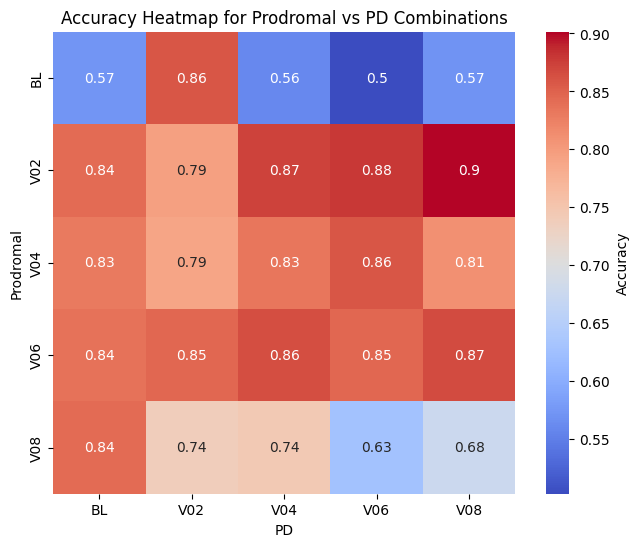

In [119]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

pro = []
PD= []
acc = []
for i,j in ACCURACY_DICT.items():
    pro.append(i.split('_')[1])
    PD.append(i.split('_')[-1])
    acc.append(j)


accuracy_table_pro_PD = pd.DataFrame([PD,pro,acc]).T
accuracy_table_pro_PD  = accuracy_table_pro_PD.rename(columns = {0:'PD', 1:'Prodromal', 2: 'Accuracy'})

accuracy_table_pro_PD['Accuracy'] = accuracy_table_pro_PD['Accuracy'].astype(float)
heatmap_data_ = accuracy_table_pro_PD.pivot(index="Prodromal", columns="PD", values="Accuracy")

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data_, annot=True, cmap="coolwarm", square=True, cbar_kws={'label': 'Accuracy'})
plt.title("Accuracy Heatmap for Prodromal vs PD Combinations")
plt.show()

In [120]:
accuracy_table_pro_PD

,PD,Prodromal,Accuracy
0,BL,BL,0.572542
1,V08,BL,0.570625
2,V06,BL,0.502750
3,V04,BL,0.560292
4,V02,BL,0.858333
5,BL,V08,0.842750
6,V08,V08,0.676250
7,V06,V08,0.628375
8,V04,V08,0.744750
9,V02,V08,0.737125


In [121]:
heatmap_data_

PD,BL,V02,V04,V06,V08
Prodromal,,,,,
BL,0.572542,0.858333,0.560292,0.502750,0.570625
V02,0.843583,0.794708,0.873417,0.878792,0.901500
V04,0.831000,0.790375,0.833167,0.858083,0.810083
V06,0.836292,0.845500,0.864708,0.846917,0.866000
V08,0.842750,0.737125,0.744750,0.628375,0.676250


In [122]:
heatmap_data_.T

Prodromal,BL,V02,V04,V06,V08
PD,,,,,
BL,0.572542,0.843583,0.831000,0.836292,0.842750
V02,0.858333,0.794708,0.790375,0.845500,0.737125
V04,0.560292,0.873417,0.833167,0.864708,0.744750
V06,0.502750,0.878792,0.858083,0.846917,0.628375
V08,0.570625,0.901500,0.810083,0.866000,0.676250


In [123]:
FEATURE_IMPORTANCES['Prodromal_V08_PD_BL_0']

{'ENSG00000144893': -0.004301609576169341,
 'ENSG00000170175': 0.0023724857108294002,
 'ENSG00000272414': 0.00020820924316975362,
 'ENSG00000141431': 0.0006053602055949278,
 'ENSG00000130787': 0.004429971633949353,
 'ENSG00000109743': -0.026546671317172987,
 'ENSG00000150672': 9.558236676689083e-05,
 'ENSG00000141699': -0.024166506517103056,
 'ENSG00000151338': -0.0048875780879592025,
 'ENSG00000068745': 0.037759383719305956,
 'ENSG00000071054': -0.03952853847504453,
 'ENSG00000182568': 0.06536400412860355,
 'ENSG00000143772': -0.028450349284101107,
 'ENSG00000136235': -0.0007180255403931935,
 'ENSG00000079841': -7.383383163363612e-05,
 'ENSG00000167207': -0.0704601572149274,
 'ENSG00000116991': -0.01698173200800136,
 'ENSG00000178950': 0.014860192105288706,
 'ENSG00000115041': -0.0001819184277604811,
 'ENSG00000117280': -0.013932121237504523,
 'ENSG00000110315': -0.03481471834372265,
 'ENSG00000152214': 0.0005466064047722954,
 'ENSG00000107862': -0.002127628093484509,
 'ENSG0000013979

In [124]:
FEATURE_IMPORTANCES['Prodromal_V08_PD_BL_0']
sorted_1_dict_FEATURE_IMPORTANCES_asc = dict(sorted(FEATURE_IMPORTANCES['Prodromal_V08_PD_BL_0'].items(), key=lambda item: item[1]))
sorted_1_dict_FEATURE_IMPORTANCES_asc 

{'ENSG00000143226': -0.18079863693407516,
 'ENSG00000010810': -0.12370735722430738,
 'ENSG00000167207': -0.0704601572149274,
 'ENSG00000164733': -0.06210796909905972,
 'ENSG00000137073': -0.05643569478341757,
 'ENSG00000069275': -0.04143597845290565,
 'ENSG00000071054': -0.03952853847504453,
 'ENSG00000110315': -0.03481471834372265,
 'ENSG00000114030': -0.03448808415470772,
 'ENSG00000143772': -0.028450349284101107,
 'ENSG00000109743': -0.026546671317172987,
 'ENSG00000141699': -0.024166506517103056,
 'ENSG00000176624': -0.022940426105858655,
 'ENSG00000145335': -0.02125130038884024,
 'ENSG00000117533': -0.01956642037183467,
 'ENSG00000116991': -0.01698173200800136,
 'ENSG00000117280': -0.013932121237504523,
 'ENSG00000139793': -0.01088671515139311,
 'ENSG00000181904': -0.010088859376302687,
 'ENSG00000178177': -0.008513522805125292,
 'ENSG00000088766': -0.007666872823866425,
 'ENSG00000131979': -0.006557828145030578,
 'ENSG00000080854': -0.006208564538487948,
 'ENSG00000151338': -0.00

In [125]:
FEATURE_IMPORTANCES['Prodromal_V08_PD_V08_0']
sorted_0_dict_FEATURE_IMPORTANCES_asc = dict(sorted(FEATURE_IMPORTANCES['Prodromal_V08_PD_V08_0'].items(), key=lambda item: item[1]))

In [126]:

FEATURE_IMPORTANCES['Prodromal_V08_PD_V08_0']
sorted_0_dict_FEATURE_IMPORTANCES_asc = dict(sorted(FEATURE_IMPORTANCES['Prodromal_V08_PD_V08_0'].items(), key=lambda item: item[1]))


In [127]:
sorted_0_dict_FEATURE_IMPORTANCES_asc

{'ENSG00000137073': -0.2693345336537623,
 'ENSG00000054983': -0.24634940720846774,
 'ENSG00000178177': -0.20137791007283498,
 'ENSG00000069275': -0.1938919448948758,
 'ENSG00000176624': -0.16839280705102105,
 'ENSG00000131979': -0.15572038982189793,
 'ENSG00000117280': -0.15390215765291795,
 'ENSG00000157540': -0.15171574152647535,
 'ENSG00000141699': -0.15067192204449617,
 'ENSG00000129003': -0.14123072255755634,
 'ENSG00000182568': -0.13582731996044536,
 'ENSG00000181904': -0.1310136861787771,
 'ENSG00000151338': -0.09628160304019512,
 'ENSG00000078070': -0.09603936318238065,
 'ENSG00000139793': -0.08566524581743545,
 'ENSG00000143226': -0.07874409544003294,
 'ENSG00000117533': -0.05895526127036153,
 'ENSG00000080854': -0.05041382675773538,
 'ENSG00000099381': -0.04627069052718865,
 'ENSG00000189157': -0.03845042478607092,
 'ENSG00000153310': -0.03730181104155087,
 'ENSG00000114030': -0.03552351241952682,
 'ENSG00000107862': -0.033548467866557165,
 'ENSG00000177200': -0.0275315129424

In [128]:
sorted_1_dict_FEATURE_IMPORTANCES_asc = dict(sorted(FEATURE_IMPORTANCES['Prodromal_V08_PD_V08_0'].items(), key=lambda item: item[1]))
sorted_1_dict_FEATURE_IMPORTANCES_asc

{'ENSG00000137073': -0.2693345336537623,
 'ENSG00000054983': -0.24634940720846774,
 'ENSG00000178177': -0.20137791007283498,
 'ENSG00000069275': -0.1938919448948758,
 'ENSG00000176624': -0.16839280705102105,
 'ENSG00000131979': -0.15572038982189793,
 'ENSG00000117280': -0.15390215765291795,
 'ENSG00000157540': -0.15171574152647535,
 'ENSG00000141699': -0.15067192204449617,
 'ENSG00000129003': -0.14123072255755634,
 'ENSG00000182568': -0.13582731996044536,
 'ENSG00000181904': -0.1310136861787771,
 'ENSG00000151338': -0.09628160304019512,
 'ENSG00000078070': -0.09603936318238065,
 'ENSG00000139793': -0.08566524581743545,
 'ENSG00000143226': -0.07874409544003294,
 'ENSG00000117533': -0.05895526127036153,
 'ENSG00000080854': -0.05041382675773538,
 'ENSG00000099381': -0.04627069052718865,
 'ENSG00000189157': -0.03845042478607092,
 'ENSG00000153310': -0.03730181104155087,
 'ENSG00000114030': -0.03552351241952682,
 'ENSG00000107862': -0.033548467866557165,
 'ENSG00000177200': -0.0275315129424

In [129]:
sorted_2_dict_FEATURE_IMPORTANCES_asc = dict(sorted(FEATURE_IMPORTANCES['Prodromal_V08_PD_V08_0'].items(), key=lambda item: item[1]))
sorted_2_dict_FEATURE_IMPORTANCES_asc

{'ENSG00000137073': -0.2693345336537623,
 'ENSG00000054983': -0.24634940720846774,
 'ENSG00000178177': -0.20137791007283498,
 'ENSG00000069275': -0.1938919448948758,
 'ENSG00000176624': -0.16839280705102105,
 'ENSG00000131979': -0.15572038982189793,
 'ENSG00000117280': -0.15390215765291795,
 'ENSG00000157540': -0.15171574152647535,
 'ENSG00000141699': -0.15067192204449617,
 'ENSG00000129003': -0.14123072255755634,
 'ENSG00000182568': -0.13582731996044536,
 'ENSG00000181904': -0.1310136861787771,
 'ENSG00000151338': -0.09628160304019512,
 'ENSG00000078070': -0.09603936318238065,
 'ENSG00000139793': -0.08566524581743545,
 'ENSG00000143226': -0.07874409544003294,
 'ENSG00000117533': -0.05895526127036153,
 'ENSG00000080854': -0.05041382675773538,
 'ENSG00000099381': -0.04627069052718865,
 'ENSG00000189157': -0.03845042478607092,
 'ENSG00000153310': -0.03730181104155087,
 'ENSG00000114030': -0.03552351241952682,
 'ENSG00000107862': -0.033548467866557165,
 'ENSG00000177200': -0.0275315129424

In [130]:
data.DIAGNOSIS.value_counts()

AttributeError: 'dict' object has no attribute 'DIAGNOSIS'

In [ ]:
data['DIAGNOSIS_2'] = data['DIAGNOSIS']

In [ ]:
data['DIAGNOSIS'].replace({'Control': '1.Control', 'Prodromal': '2.Prodromal', 'PD': '3.PD'}, inplace=True)


In [ ]:
data['New_Time_Point'] = data['DIAGNOSIS'] + '_' + data['Time_Point']
data['New_Time_Point_2'] = data['DIAGNOSIS_2'] + '_' + data['Time_Point']

In [ ]:
data = data.sort_values(by = 'New_Time_Point')

In [131]:
tmp_data = data[data.Time_Point !='V02']

AttributeError: 'dict' object has no attribute 'Time_Point'

In [132]:
tmp_data

,DIAGNOSIS,Patient_Name,Time_Point,ENSG00000144893,ENSG00000170175,ENSG00000272414,ENSG00000141431,ENSG00000130787,ENSG00000109743,ENSG00000150672,...,ENSG00000204614,ENSG00000153310,ENSG00000164181,ENSG00000188906,ENSG00000103528,ENSG00000176624,ENSG00000170745,DIAGNOSIS_2,New_Time_Point,New_Time_Point_2
2979,1.Control,4067,BL,0.543518,3.197770,0.384194,0.804654,4.29506,30.48520,1.649230,...,0.139794,171.8860,5.57202,226.5040,0.609876,14.10790,0.084560,Control,1.Control_BL,Control_BL
1675,1.Control,3555,BL,0.580556,3.087820,0.151217,1.256690,5.22578,33.35660,1.710370,...,0.156435,203.4150,4.56905,273.0890,0.871220,13.39070,0.274084,Control,1.Control_BL,Control_BL
1672,1.Control,3554,BL,0.362683,3.447560,0.063802,0.914430,4.75901,12.63360,1.082040,...,0.010754,89.8261,1.13242,96.8387,0.614892,13.96450,0.004377,Control,1.Control_BL,Control_BL
1663,1.Control,3551,BL,0.756932,6.606180,0.217391,2.637160,8.81006,40.28770,2.526490,...,0.059412,282.7310,3.61977,318.7960,1.333970,20.52840,0.000000,Control,1.Control_BL,Control_BL
1844,1.Control,3614,BL,0.299293,2.615800,0.143025,1.132650,3.59603,22.15220,0.690482,...,0.090544,118.8150,5.68066,141.7070,0.461232,11.56700,0.000000,Control,1.Control_BL,Control_BL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1047,3.PD,3352,V08,0.171821,0.790059,0.043989,0.238740,1.66795,6.98171,0.190254,...,0.020154,37.7389,1.59273,56.6825,0.259515,4.16799,0.042577,PD,3.PD_V08,PD_V08
3260,3.PD,4099,V08,0.857602,4.746150,0.084664,1.711540,2.89427,41.63010,0.871110,...,0.242873,202.1650,5.22740,293.4120,0.788105,14.44900,0.131292,PD,3.PD_V08,PD_V08
578,3.PD,3154,V08,0.345196,3.899410,0.135728,1.068480,4.49988,23.61670,1.588490,...,0.114954,128.9640,2.11863,174.4590,0.614786,19.38700,0.033372,PD,3.PD_V08,PD_V08
1992,3.PD,3700,V08,0.461099,2.291530,0.028646,1.346710,3.66953,21.12870,0.638862,...,0.040979,131.6000,6.36146,136.9140,0.333198,15.31520,0.269133,PD,3.PD_V08,PD_V08


In [133]:
df = pd.DataFrame(sorted_2_dict_FEATURE_IMPORTANCES_asc.items())
df[2] = np.abs(df[1])
df = df.sort_values(by = 2, ascending=False)
df

,0,1,2
81,ENSG00000071054,0.439745,0.439745
0,ENSG00000137073,-0.269335,0.269335
1,ENSG00000054983,-0.246349,0.246349
80,ENSG00000147439,0.236165,0.236165
79,ENSG00000116991,0.202059,0.202059
...,...,...,...
43,ENSG00000077943,0.000750,0.000750
42,ENSG00000136235,0.000439,0.000439
41,ENSG00000152128,0.000191,0.000191
40,ENSG00000010810,0.000082,0.000082


In [134]:
genes = df[0].values.tolist()

In [135]:
def return_gene_name(ensembleid):

    try:
        return results[results['Gene stable ID'] == ensembleid]['Gene name'].values[0]
    except:
        return ensembleid

In [136]:
len(genes)

82

In [137]:
len(genes[50:95])

32

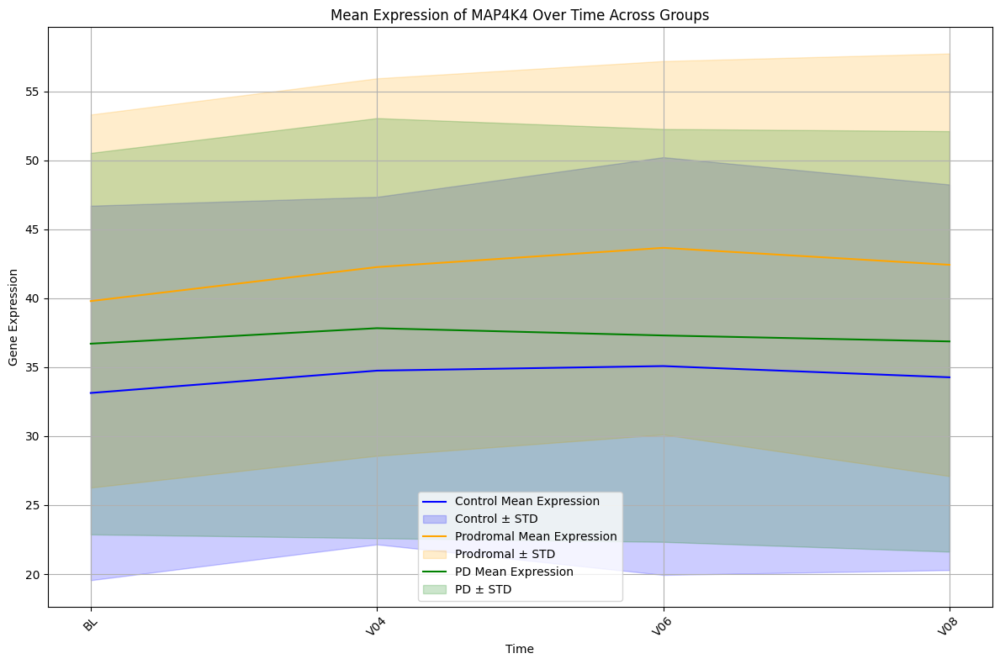

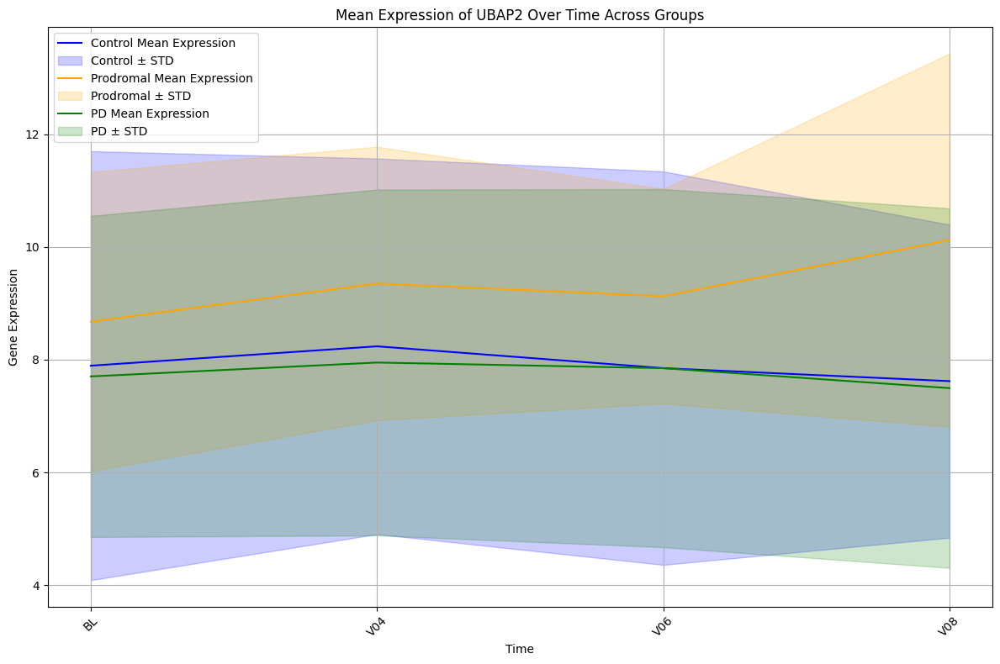

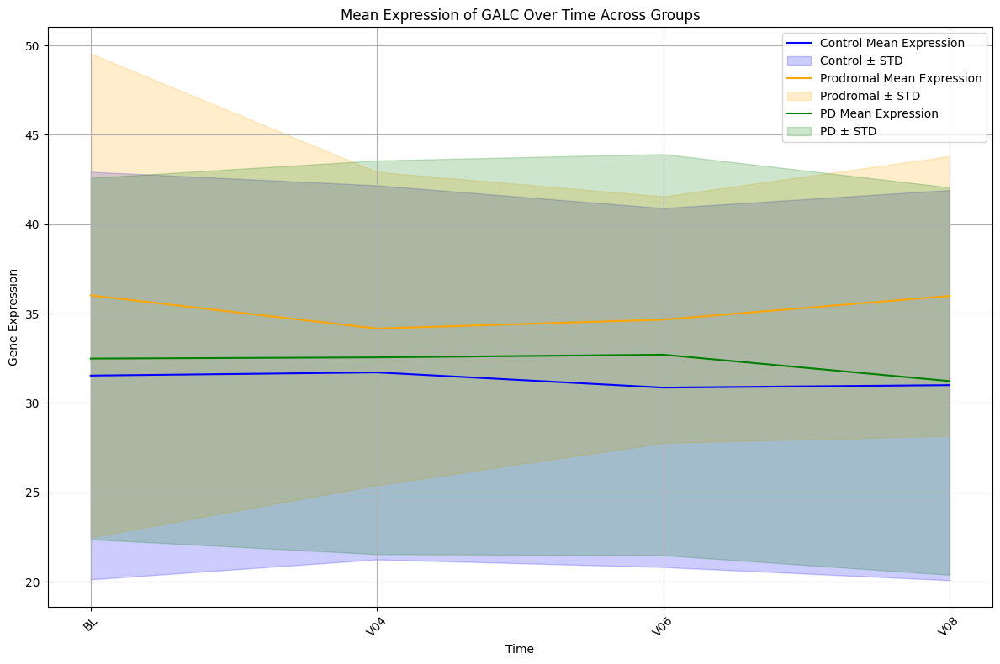

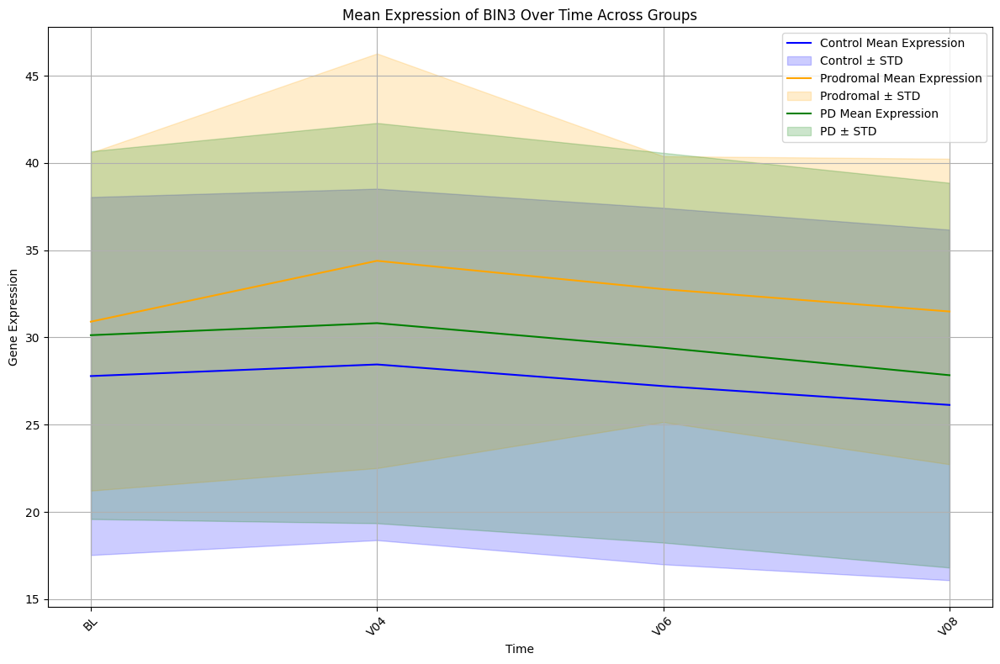

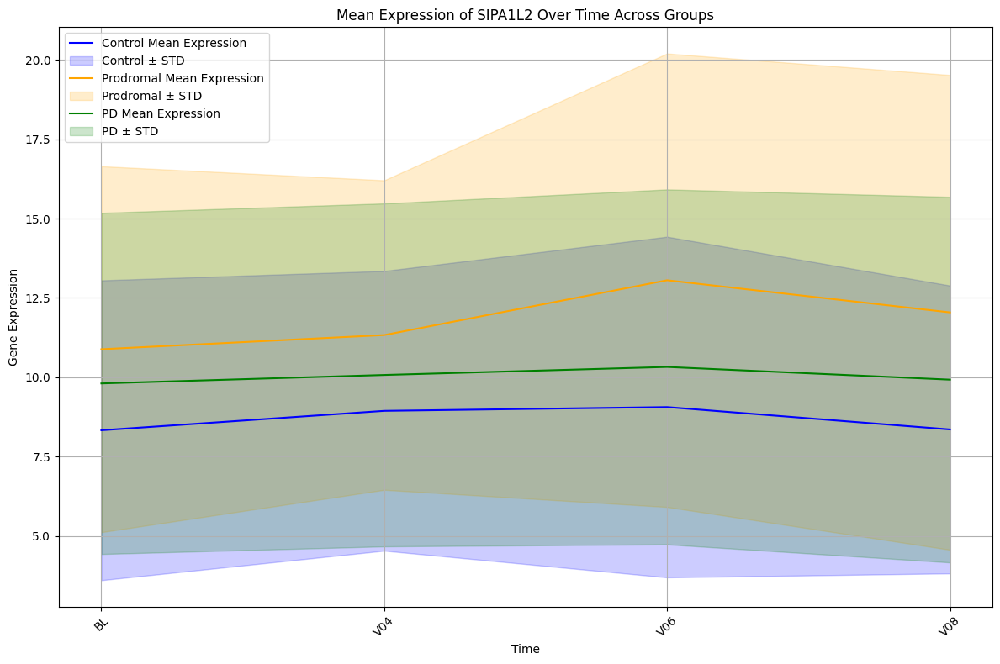

...

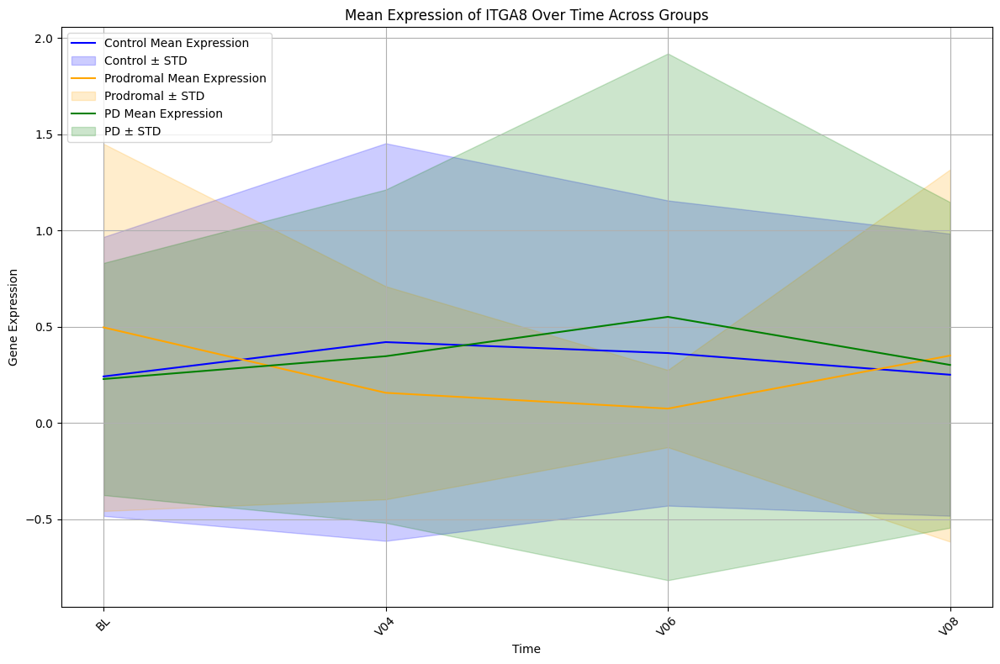

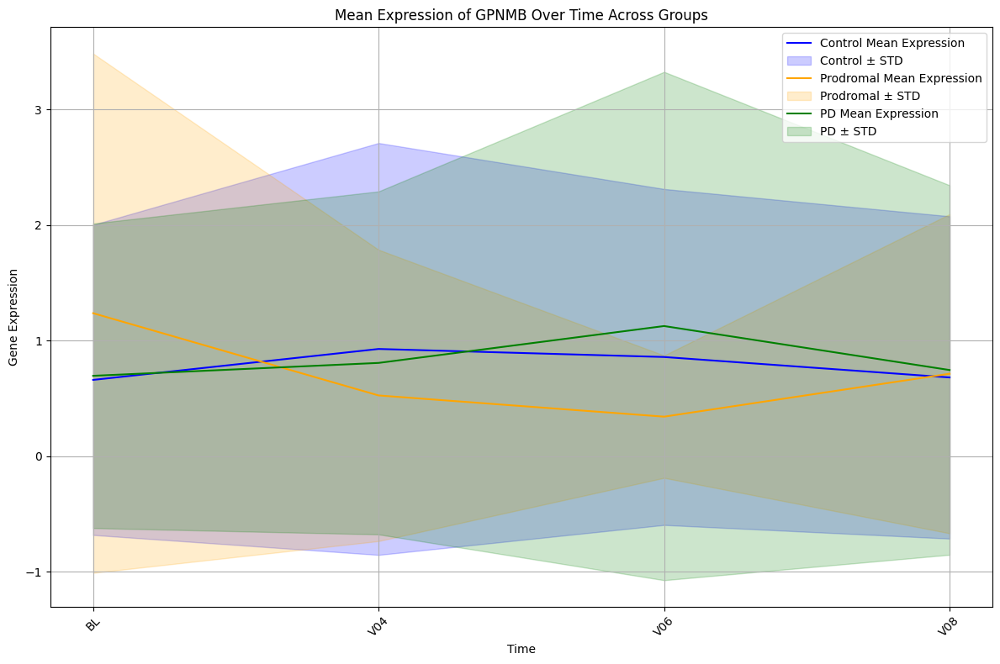

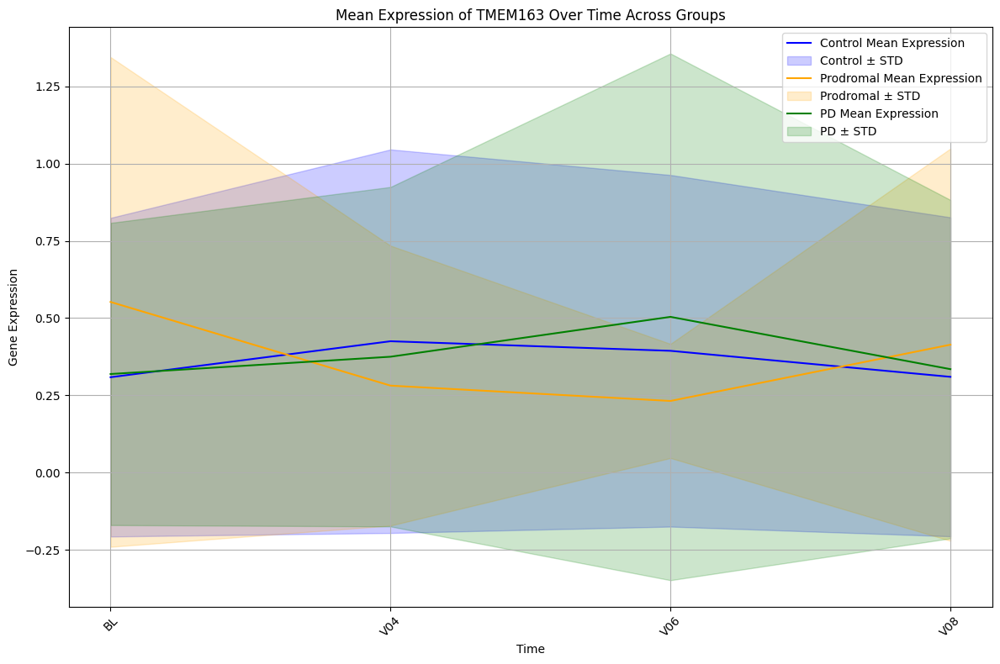

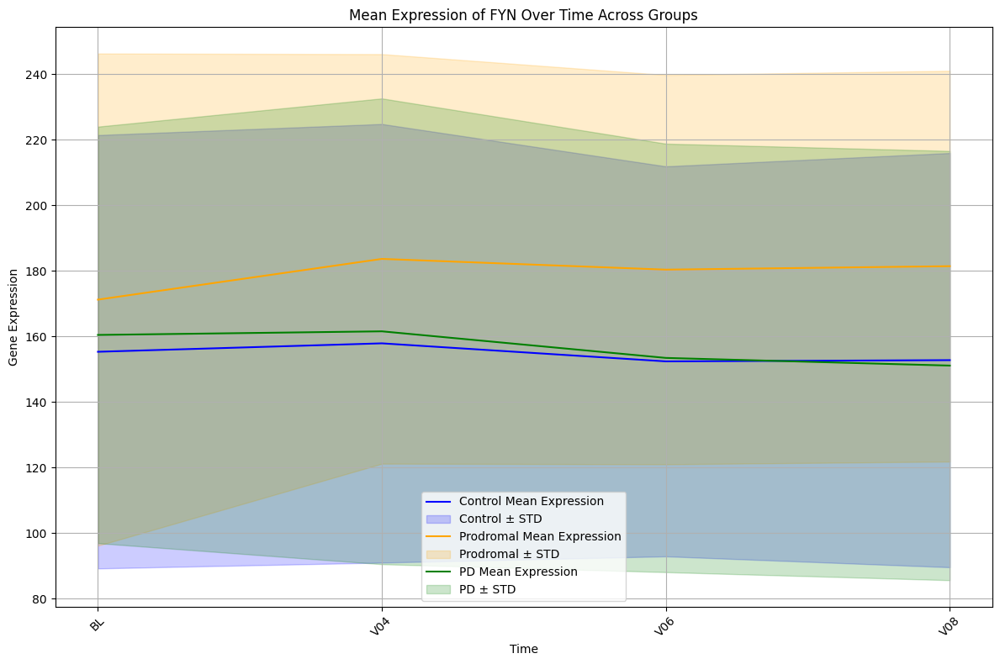

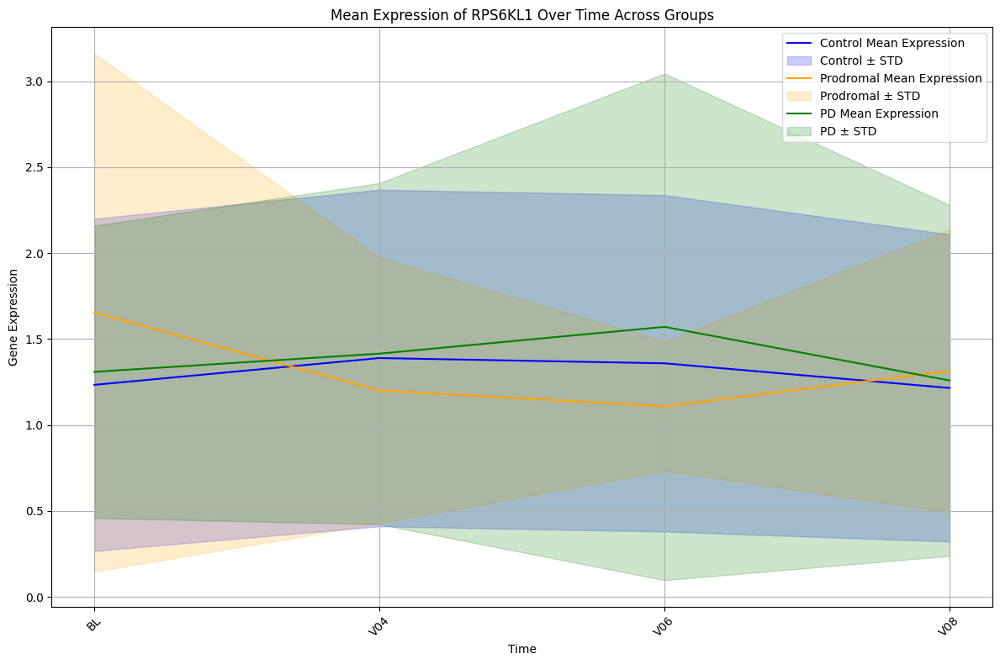

In [138]:
import matplotlib.pyplot as plt

# Loop through each gene
for gene in genes:
    # Create a new figure for each gene
    plt.figure(figsize=(12, 8))
    
    # Define a list to store the group data
    groups = ['Control', 'Prodromal', 'PD']
    colors = {'Control': 'blue', 'Prodromal': 'orange', 'PD': 'green'}
    
    for group in groups:
        # Filter and sort data by group
        group_tmp_data = tmp_data[tmp_data['New_Time_Point_2'].str.startswith(group)]
        group_tmp_data = group_tmp_data.sort_values(by='New_Time_Point')
        
        # Calculate mean and standard deviation
        mean_expression = group_tmp_data.groupby('New_Time_Point')[gene].mean()
        std_expression = group_tmp_data.groupby('New_Time_Point')[gene].std()
        
        # Extract clean time points
        index = [i.split('_')[1] for i in mean_expression.index]
        
        # Plot mean expression
        plt.plot(index, mean_expression, color=colors[group], label=f'{group} Mean Expression')
        
        # Fill the standard deviation area
        plt.fill_between(index,
                         mean_expression - std_expression,
                         mean_expression + std_expression,
                         color=colors[group], alpha=0.2, label=f'{group} ± STD')
    
    # Customize plot
    plt.xlabel('Time')
    plt.ylabel('Gene Expression')
    gene  = return_gene_name(gene)
    plt.title(f'Mean Expression of {gene} Over Time Across Groups')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    
    # Show the plot
    plt.show()



In [139]:
FEATURE_IMPORTANCES.keys()

dict_keys(['Prodromal_BL_PD_BL_0', 'Prodromal_BL_PD_BL_1', 'Prodromal_BL_PD_BL_2', 'Prodromal_BL_PD_BL_3', 'Prodromal_BL_PD_BL_4', 'Prodromal_BL_PD_BL_5', 'Prodromal_BL_PD_BL_6', 'Prodromal_BL_PD_BL_7', 'Prodromal_BL_PD_BL_8', 'Prodromal_BL_PD_BL_9', 'Prodromal_BL_PD_BL_10', 'Prodromal_BL_PD_BL_11', 'Prodromal_BL_PD_BL_12', 'Prodromal_BL_PD_BL_13', 'Prodromal_BL_PD_BL_14', 'Prodromal_BL_PD_BL_15', 'Prodromal_BL_PD_BL_16', 'Prodromal_BL_PD_BL_17', 'Prodromal_BL_PD_BL_18', 'Prodromal_BL_PD_BL_19', 'Prodromal_BL_PD_BL_20', 'Prodromal_BL_PD_BL_21', 'Prodromal_BL_PD_BL_22', 'Prodromal_BL_PD_BL_23', 'Prodromal_BL_PD_BL_24', 'Prodromal_BL_PD_BL_25', 'Prodromal_BL_PD_BL_26', 'Prodromal_BL_PD_BL_27', 'Prodromal_BL_PD_BL_28', 'Prodromal_BL_PD_BL_29', 'Prodromal_BL_PD_BL_30', 'Prodromal_BL_PD_BL_31', 'Prodromal_BL_PD_BL_32', 'Prodromal_BL_PD_BL_33', 'Prodromal_BL_PD_BL_34', 'Prodromal_BL_PD_BL_35', 'Prodromal_BL_PD_BL_36', 'Prodromal_BL_PD_BL_37', 'Prodromal_BL_PD_BL_38', 'Prodromal_BL_PD_BL_39',

In [140]:
compare_list = [ 'Prodromal_BL_PD_BL',  'Prodromal_V02_PD_V02' ,'Prodromal_V04_PD_V04','Prodromal_V06_PD_V06', 'Prodromal_V08_PD_V08']

In [141]:
compare_list

['Prodromal_BL_PD_BL',
 'Prodromal_V02_PD_V02',
 'Prodromal_V04_PD_V04',
 'Prodromal_V06_PD_V06',
 'Prodromal_V08_PD_V08']

In [142]:
FEATURE_IMPORTANCES_Prodromal_BL_PD_BL = dict()
FEATURE_IMPORTANCES_Prodromal_V02_PD_V02 = dict()
FEATURE_IMPORTANCES_Prodromal_V04_PD_V04 = dict()
FEATURE_IMPORTANCES_Prodromal_V06_PD_V06 = dict()
FEATURE_IMPORTANCES_Prodromal_V08_PD_V08 = dict()

for i in FEATURE_IMPORTANCES.keys():
    if 'Prodromal_BL_PD_BL' in i:
        FEATURE_IMPORTANCES_Prodromal_BL_PD_BL[i] = FEATURE_IMPORTANCES[i]

    elif 'Prodromal_V02_PD_V02' in i:
        FEATURE_IMPORTANCES_Prodromal_V02_PD_V02[i] = FEATURE_IMPORTANCES[i]

    elif 'Prodromal_V04_PD_V04' in i:
        FEATURE_IMPORTANCES_Prodromal_V04_PD_V04[i] = FEATURE_IMPORTANCES[i]

    elif 'Prodromal_V06_PD_V06' in i:
        FEATURE_IMPORTANCES_Prodromal_V06_PD_V06[i] = FEATURE_IMPORTANCES[i]

    elif 'Prodromal_V08_PD_V08' in i:
        FEATURE_IMPORTANCES_Prodromal_V08_PD_V08[i] = FEATURE_IMPORTANCES[i]
        
        

In [143]:
list(FEATURE_IMPORTANCES_Prodromal_BL_PD_BL.keys())[:10]

['Prodromal_BL_PD_BL_0',
 'Prodromal_BL_PD_BL_1',
 'Prodromal_BL_PD_BL_2',
 'Prodromal_BL_PD_BL_3',
 'Prodromal_BL_PD_BL_4',
 'Prodromal_BL_PD_BL_5',
 'Prodromal_BL_PD_BL_6',
 'Prodromal_BL_PD_BL_7',
 'Prodromal_BL_PD_BL_8',
 'Prodromal_BL_PD_BL_9']

In [144]:
genes_list = list(FEATURE_IMPORTANCES_Prodromal_BL_PD_BL['Prodromal_BL_PD_BL_0'].keys())
genes_list[0:10]

['ENSG00000144893',
 'ENSG00000170175',
 'ENSG00000272414',
 'ENSG00000141431',
 'ENSG00000130787',
 'ENSG00000109743',
 'ENSG00000150672',
 'ENSG00000141699',
 'ENSG00000151338',
 'ENSG00000068745']

In [145]:
len(FEATURE_IMPORTANCES_Prodromal_BL_PD_BL.keys())

1000

In [146]:
AVG_FEATURE_IMPORTANCES_Prodromal_BL_PD_BL = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_BL_PD_BL.keys():
        s += FEATURE_IMPORTANCES_Prodromal_BL_PD_BL[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_BL_PD_BL.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_BL_PD_BL[i] = s


AVG_FEATURE_IMPORTANCES_Prodromal_V02_PD_V02 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_V02_PD_V02.keys():
        s += FEATURE_IMPORTANCES_Prodromal_V02_PD_V02[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_V02_PD_V02.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_V02_PD_V02[i] = s


AVG_FEATURE_IMPORTANCES_Prodromal_V04_PD_V04 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_V04_PD_V04.keys():
        s += FEATURE_IMPORTANCES_Prodromal_V04_PD_V04[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_V04_PD_V04.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_V04_PD_V04[i] = s


AVG_FEATURE_IMPORTANCES_Prodromal_V06_PD_V06 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_V06_PD_V06.keys():
        s += FEATURE_IMPORTANCES_Prodromal_V06_PD_V06[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_V06_PD_V06.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_V06_PD_V06[i] = s


AVG_FEATURE_IMPORTANCES_Prodromal_V08_PD_V08 = dict()
for i in genes_list:
    s = 0
    for k in FEATURE_IMPORTANCES_Prodromal_V08_PD_V08.keys():
        s += FEATURE_IMPORTANCES_Prodromal_V08_PD_V08[k][i]
    s = s/len(FEATURE_IMPORTANCES_Prodromal_V08_PD_V08.keys())
    AVG_FEATURE_IMPORTANCES_Prodromal_V08_PD_V08[i] = s
      

In [147]:
AVG_FEATURE_IMPORTANCES_Prodromal_BL_PD_BL

{'ENSG00000144893': -0.10489691616188623,
 'ENSG00000170175': -0.3303527748392357,
 'ENSG00000272414': 0.01465852489950833,
 'ENSG00000141431': -0.5101559871447238,
 'ENSG00000130787': -0.20936043735035326,
 'ENSG00000109743': 0.15259022570697672,
 'ENSG00000150672': -0.10505048684382261,
 'ENSG00000141699': 0.1796043764161592,
 'ENSG00000151338': -0.3414250759394721,
 'ENSG00000068745': 0.5086879139448178,
 'ENSG00000071054': 0.031674690506477615,
 'ENSG00000182568': 0.12493695251757272,
 'ENSG00000143772': -0.697247320981672,
 'ENSG00000136235': 0.355251643747484,
 'ENSG00000079841': -0.02646607578286307,
 'ENSG00000167207': -0.1772695046108316,
 'ENSG00000116991': -0.14105882692224406,
 'ENSG00000178950': 0.01701112069835361,
 'ENSG00000115041': -0.01882824320774243,
 'ENSG00000117280': -0.45327218634652555,
 'ENSG00000110315': 0.12651932891170908,
 'ENSG00000152214': 0.07940824278714739,
 'ENSG00000107862': -0.21205969973308997,
 'ENSG00000139793': -0.41273568796880417,
 'ENSG00000

In [148]:
FEATURE_IMPORTANCES_MERGE = dict()

In [149]:
FEATURE_IMPORTANCES_MERGE['Prodromal_BL_PD_BL'] = AVG_FEATURE_IMPORTANCES_Prodromal_BL_PD_BL
FEATURE_IMPORTANCES_MERGE['Prodromal_V02_PD_V02'] = AVG_FEATURE_IMPORTANCES_Prodromal_V02_PD_V02
FEATURE_IMPORTANCES_MERGE['Prodromal_V04_PD_V04'] = AVG_FEATURE_IMPORTANCES_Prodromal_V04_PD_V04
FEATURE_IMPORTANCES_MERGE['Prodromal_V06_PD_V06'] = AVG_FEATURE_IMPORTANCES_Prodromal_V06_PD_V06
FEATURE_IMPORTANCES_MERGE['Prodromal_V08_PD_V08'] = AVG_FEATURE_IMPORTANCES_Prodromal_V08_PD_V08


In [150]:
ranking_of_features = []
for i in compare_list:


    df = pd.DataFrame(FEATURE_IMPORTANCES_MERGE[i].items())
    df[2] = np.abs(df[1])
    df = df.sort_values(by = 2, ascending=False)
    print(df)
    ranking_of_features.append(df[0].tolist())


                  0         1         2
58  ENSG00000078070 -1.038532  1.038532
26  ENSG00000181904 -0.816230  0.816230
30  ENSG00000102547 -0.718630  0.718630
77  ENSG00000164181 -0.703282  0.703282
12  ENSG00000143772 -0.697247  0.697247
..              ...       ...       ...
50  ENSG00000054983  0.009204  0.009204
34  ENSG00000078579  0.007729  0.007729
52  ENSG00000010810  0.005771  0.005771
57  ENSG00000112306  0.001710  0.001710
28  ENSG00000145335  0.001183  0.001183

[82 rows x 3 columns]
                  0         1         2
7   ENSG00000141699  0.737861  0.737861
60  ENSG00000147439  0.526016  0.526016
27  ENSG00000178177 -0.488276  0.488276
56  ENSG00000069275  0.443614  0.443614
59  ENSG00000198648 -0.418993  0.418993
..              ...       ...       ...
26  ENSG00000181904 -0.004872  0.004872
64  ENSG00000117533  0.004277  0.004277
34  ENSG00000078579 -0.003049  0.003049
38  ENSG00000152128 -0.002915  0.002915
22  ENSG00000107862  0.002206  0.002206

[82 rows x 3 col

In [151]:
ranking_of_features[4][0:10]

['ENSG00000071054',
 'ENSG00000137073',
 'ENSG00000163463',
 'ENSG00000157540',
 'ENSG00000054983',
 'ENSG00000116991',
 'ENSG00000178177',
 'ENSG00000176624',
 'ENSG00000069275',
 'ENSG00000164733']

In [152]:
gene_lists = ranking_of_features

In [153]:
gene_lists

[['ENSG00000078070',
  'ENSG00000181904',
  'ENSG00000102547',
  'ENSG00000164181',
  'ENSG00000143772',
  'ENSG00000005206',
  'ENSG00000117533',
  'ENSG00000163344',
  'ENSG00000141431',
  'ENSG00000068745',
  'ENSG00000136492',
  'ENSG00000138760',
  'ENSG00000112787',
  'ENSG00000189157',
  'ENSG00000108312',
  'ENSG00000117280',
  'ENSG00000139793',
  'ENSG00000129003',
  'ENSG00000163463',
  'ENSG00000080854',
  'ENSG00000177455',
  'ENSG00000136235',
  'ENSG00000151338',
  'ENSG00000145349',
  'ENSG00000170175',
  'ENSG00000127419',
  'ENSG00000088766',
  'ENSG00000177200',
  'ENSG00000109572',
  'ENSG00000099381',
  'ENSG00000178177',
  'ENSG00000107862',
  'ENSG00000130787',
  'ENSG00000114030',
  'ENSG00000141699',
  'ENSG00000167207',
  'ENSG00000198208',
  'ENSG00000147439',
  'ENSG00000109743',
  'ENSG00000139218',
  'ENSG00000069275',
  'ENSG00000116991',
  'ENSG00000103528',
  'ENSG00000110315',
  'ENSG00000182568',
  'ENSG00000170745',
  'ENSG00000150672',
  'ENSG000001

In [154]:
gene_indices = {}

# Loop through each list and index each gene
for list_idx, gene_list in enumerate(gene_lists):
    for gene_idx, gene in enumerate(gene_list):
        # Initialize the gene's entry if not present
        if gene not in gene_indices:
            gene_indices[gene] = [-1] * len(gene_lists)  # Default -1 for lists where gene is absent
        # Update the index of the gene in the current list
        gene_indices[gene][list_idx] = gene_idx

# Display results
for gene, indices in gene_indices.items():
    print(f"{gene}: {indices}")

ENSG00000078070: [0, 31, 10, 19, 30]
ENSG00000181904: [1, 77, 17, 1, 16]
ENSG00000102547: [2, 26, 61, 39, 77]
ENSG00000164181: [3, 19, 24, 32, 14]
ENSG00000143772: [4, 18, 35, 0, 57]
ENSG00000005206: [5, 23, 5, 3, 15]
ENSG00000117533: [6, 78, 21, 8, 31]
ENSG00000163344: [7, 14, 32, 26, 52]
ENSG00000141431: [8, 50, 51, 52, 76]
ENSG00000068745: [9, 7, 9, 6, 17]
ENSG00000136492: [10, 60, 47, 49, 44]
ENSG00000138760: [11, 12, 18, 36, 53]
ENSG00000112787: [12, 34, 37, 16, 39]
ENSG00000189157: [13, 61, 31, 33, 38]
ENSG00000108312: [14, 22, 60, 23, 20]
ENSG00000117280: [15, 28, 13, 27, 19]
ENSG00000139793: [16, 13, 15, 12, 12]
ENSG00000129003: [17, 62, 34, 20, 21]
ENSG00000163463: [18, 46, 0, 7, 2]
ENSG00000080854: [19, 27, 45, 70, 46]
ENSG00000177455: [20, 47, 77, 42, 56]
ENSG00000136235: [21, 40, 57, 46, 71]
ENSG00000151338: [22, 15, 14, 24, 13]
ENSG00000145349: [23, 10, 75, 30, 23]
ENSG00000170175: [24, 72, 41, 62, 54]
ENSG00000127419: [25, 25, 64, 65, 33]
ENSG00000088766: [26, 58, 23, 41,

In [155]:
ranking_df = pd.DataFrame(gene_indices).T
ranking_df.columns = ['BL','V02','V04','V06','V08']
ranking_df

,BL,V02,V04,V06,V08
ENSG00000078070,0,31,10,19,30
ENSG00000181904,1,77,17,1,16
ENSG00000102547,2,26,61,39,77
ENSG00000164181,3,19,24,32,14
ENSG00000143772,4,18,35,0,57
...,...,...,...,...,...
ENSG00000054983,77,24,2,9,4
ENSG00000078579,78,79,66,80,70
ENSG00000010810,79,76,67,77,37
ENSG00000112306,80,70,72,71,50


In [156]:
def return_gene_name(ensembleid):

    try:
        return results[results['Gene stable ID'] == ensembleid]['Gene name'].values[0]
    except:
        return np.nan

In [157]:
tmp_df = ranking_df.reset_index()
ranking_df['Gene_Name'] =tmp_df['index'].apply(return_gene_name).tolist()

In [158]:
ranking_df[ranking_df.Gene_Name.isna()]

,BL,V02,V04,V06,V08,Gene_Name
ENSG00000153310,49,39,68,72,51,NaN


In [159]:
ranking_df.loc['ENSG00000153310','Gene_Name'] = 'FAM49B'


In [160]:
ranking_df.set_index('Gene_Name',inplace=True)
ranking_df

,BL,V02,V04,V06,V08
Gene_Name,,,,,
MCCC1,0,31,10,19,30
C5orf24,1,77,17,1,16
CAB39L,2,26,61,39,77
ELOVL7,3,19,24,32,14
ITPKB,4,18,35,0,57
...,...,...,...,...,...
GALC,77,24,2,9,4
FGF20,78,79,66,80,70
FYN,79,76,67,77,37


In [161]:
ranking_df.to_csv('ranking_df/Lancet_pd_genes_prodromal_to_PD_ranking_df.csv', index=True)

In [162]:
subset_dict = {key: gene_indices[key] for key in ranking_of_features[4] if key in gene_indices}

print(subset_dict)

{'ENSG00000071054': [67, 8, 12, 50, 0], 'ENSG00000137073': [50, 11, 8, 11, 1], 'ENSG00000163463': [18, 46, 0, 7, 2], 'ENSG00000157540': [64, 6, 7, 31, 3], 'ENSG00000054983': [77, 24, 2, 9, 4], 'ENSG00000116991': [41, 9, 6, 21, 5], 'ENSG00000178177': [30, 2, 4, 2, 6], 'ENSG00000176624': [59, 36, 19, 5, 7], 'ENSG00000069275': [40, 3, 11, 58, 8], 'ENSG00000164733': [62, 37, 38, 53, 9], 'ENSG00000147439': [37, 1, 16, 15, 10], 'ENSG00000131979': [57, 5, 3, 10, 11], 'ENSG00000139793': [16, 13, 15, 12, 12], 'ENSG00000151338': [22, 15, 14, 24, 13], 'ENSG00000164181': [3, 19, 24, 32, 14], 'ENSG00000005206': [5, 23, 5, 3, 15], 'ENSG00000181904': [1, 77, 17, 1, 16], 'ENSG00000068745': [9, 7, 9, 6, 17], 'ENSG00000109572': [28, 17, 25, 14, 18], 'ENSG00000117280': [15, 28, 13, 27, 19], 'ENSG00000108312': [14, 22, 60, 23, 20], 'ENSG00000129003': [17, 62, 34, 20, 21], 'ENSG00000139218': [39, 32, 26, 54, 22], 'ENSG00000145349': [23, 10, 75, 30, 23], 'ENSG00000198648': [51, 4, 20, 13, 24], 'ENSG00000143

In [163]:
subset_dict

{'ENSG00000071054': [67, 8, 12, 50, 0],
 'ENSG00000137073': [50, 11, 8, 11, 1],
 'ENSG00000163463': [18, 46, 0, 7, 2],
 'ENSG00000157540': [64, 6, 7, 31, 3],
 'ENSG00000054983': [77, 24, 2, 9, 4],
 'ENSG00000116991': [41, 9, 6, 21, 5],
 'ENSG00000178177': [30, 2, 4, 2, 6],
 'ENSG00000176624': [59, 36, 19, 5, 7],
 'ENSG00000069275': [40, 3, 11, 58, 8],
 'ENSG00000164733': [62, 37, 38, 53, 9],
 'ENSG00000147439': [37, 1, 16, 15, 10],
 'ENSG00000131979': [57, 5, 3, 10, 11],
 'ENSG00000139793': [16, 13, 15, 12, 12],
 'ENSG00000151338': [22, 15, 14, 24, 13],
 'ENSG00000164181': [3, 19, 24, 32, 14],
 'ENSG00000005206': [5, 23, 5, 3, 15],
 'ENSG00000181904': [1, 77, 17, 1, 16],
 'ENSG00000068745': [9, 7, 9, 6, 17],
 'ENSG00000109572': [28, 17, 25, 14, 18],
 'ENSG00000117280': [15, 28, 13, 27, 19],
 'ENSG00000108312': [14, 22, 60, 23, 20],
 'ENSG00000129003': [17, 62, 34, 20, 21],
 'ENSG00000139218': [39, 32, 26, 54, 22],
 'ENSG00000145349': [23, 10, 75, 30, 23],
 'ENSG00000198648': [51, 4, 20

In [164]:
gene_ranks = subset_dict


In [165]:
# Original dictionary with gene rankings
'''gene_ranks = subset_dict


# Flatten the list to find the min and max values across all rankings
all_ranks = [rank for ranks in gene_ranks.values() for rank in ranks]
min_rank, max_rank = min(all_ranks), max(all_ranks)

# Normalize each ranking
normalized_gene_ranks = {
    gene: [(rank - min_rank) / (max_rank - min_rank) * 10 for rank in ranks]
    for gene, ranks in gene_ranks.items()
}

# Display the normalized rankings
for gene, normalized_ranks in normalized_gene_ranks.items():
    print(f"{gene}: {normalized_ranks}")'''


'gene_ranks = subset_dict\n\n\n# Flatten the list to find the min and max values across all rankings\nall_ranks = [rank for ranks in gene_ranks.values() for rank in ranks]\nmin_rank, max_rank = min(all_ranks), max(all_ranks)\n\n# Normalize each ranking\nnormalized_gene_ranks = {\n    gene: [(rank - min_rank) / (max_rank - min_rank) * 10 for rank in ranks]\n    for gene, ranks in gene_ranks.items()\n}\n\n# Display the normalized rankings\nfor gene, normalized_ranks in normalized_gene_ranks.items():\n    print(f"{gene}: {normalized_ranks}")'

In [166]:
df = pd.DataFrame(gene_ranks).T
df

,0,1,2,3,4
ENSG00000071054,67,8,12,50,0
ENSG00000137073,50,11,8,11,1
ENSG00000163463,18,46,0,7,2
ENSG00000157540,64,6,7,31,3
ENSG00000054983,77,24,2,9,4
...,...,...,...,...,...
ENSG00000102547,2,26,61,39,77
ENSG00000198208,36,35,46,29,78
ENSG00000108379,65,67,58,75,79
ENSG00000272414,74,53,80,56,80


In [167]:
df

,0,1,2,3,4
ENSG00000071054,67,8,12,50,0
ENSG00000137073,50,11,8,11,1
ENSG00000163463,18,46,0,7,2
ENSG00000157540,64,6,7,31,3
ENSG00000054983,77,24,2,9,4
...,...,...,...,...,...
ENSG00000102547,2,26,61,39,77
ENSG00000198208,36,35,46,29,78
ENSG00000108379,65,67,58,75,79
ENSG00000272414,74,53,80,56,80


In [168]:
def return_gene_name(ensembleid):

    try:
        return results[results['Gene stable ID'] == ensembleid]['Gene name'].values[0]
    except:
        return np.nan

tmp_df = df.reset_index()
df['Gene_Name'] =tmp_df['index'].apply(return_gene_name).tolist()
df.loc['ENSG00000153310','Gene_Name'] = 'FAM49B'
df.set_index('Gene_Name',inplace=True)

In [169]:
df

,0,1,2,3,4
Gene_Name,,,,,
MAP4K4,67,8,12,50,0
UBAP2,50,11,8,11,1
KRTCAP2,18,46,0,7,2
DYRK1A,64,6,7,31,3
GALC,77,24,2,9,4
...,...,...,...,...,...
CAB39L,2,26,61,39,77
RPS6KL1,36,35,46,29,78
WNT3,65,67,58,75,79


In [170]:
ranked_df = df.rank(axis=0, method='min').astype(int)

print(ranked_df)

               0   1   2   3   4
Gene_Name                       
MAP4K4        68   9  13  51   1
UBAP2         51  12   9  12   2
KRTCAP2       19  47   1   8   3
DYRK1A        65   7   8  32   4
GALC          78  25   3  10   5
...           ..  ..  ..  ..  ..
CAB39L         3  27  62  40  78
RPS6KL1       37  36  47  30  79
WNT3          66  68  59  76  80
FAM47E-STBD1  75  54  81  57  81
LRRK2         76  39  70  79  82

[82 rows x 5 columns]


In [171]:
reversed_ranks = ranked_df .max() - ranked_df  + 1

print(reversed_ranks)

               0   1   2   3   4
Gene_Name                       
MAP4K4        15  74  70  32  82
UBAP2         32  71  74  71  81
KRTCAP2       64  36  82  75  80
DYRK1A        18  76  75  51  79
GALC           5  58  80  73  78
...           ..  ..  ..  ..  ..
CAB39L        80  56  21  43   5
RPS6KL1       46  47  36  53   4
WNT3          17  15  24   7   3
FAM47E-STBD1   8  29   2  26   2
LRRK2          7  44  13   4   1

[82 rows x 5 columns]


In [172]:
rank_dict = reversed_ranks.T.to_dict(orient='list')
rank_dict

{'MAP4K4': [15, 74, 70, 32, 82],
 'UBAP2': [32, 71, 74, 71, 81],
 'KRTCAP2': [64, 36, 82, 75, 80],
 'DYRK1A': [18, 76, 75, 51, 79],
 'GALC': [5, 58, 80, 73, 78],
 'SIPA1L2': [41, 73, 76, 61, 77],
 'LCORL': [52, 80, 78, 80, 76],
 'MEX3C': [23, 46, 63, 77, 75],
 'NUCKS1': [42, 79, 71, 24, 74],
 'CTSB': [20, 45, 44, 29, 73],
 'BIN3': [45, 81, 66, 67, 72],
 'GCH1': [25, 77, 79, 72, 71],
 'MBNL2': [66, 69, 67, 70, 70],
 'MIPOL1': [60, 67, 68, 58, 69],
 'ELOVL7': [79, 63, 58, 50, 68],
 'SPPL2B': [77, 59, 77, 79, 67],
 'C5orf24': [81, 5, 65, 81, 66],
 'IP6K2': [73, 75, 73, 76, 65],
 'CLCN3': [54, 65, 57, 68, 64],
 'RAB29': [67, 54, 69, 55, 63],
 'UBTF': [68, 60, 22, 59, 62],
 'VPS13C': [65, 20, 48, 62, 61],
 'SCAF11': [43, 50, 56, 28, 60],
 'CAMK2D': [59, 72, 7, 52, 59],
 'STK39': [31, 78, 62, 69, 58],
 'FCGR2A': [6, 11, 12, 18, 57],
 'RETREG3': [48, 82, 39, 64, 56],
 'HIP1R': [50, 17, 49, 31, 55],
 'SATB1': [38, 31, 43, 16, 54],
 'NOD2': [47, 52, 23, 8, 53],
 'MCCC1': [82, 51, 72, 63, 52],
 

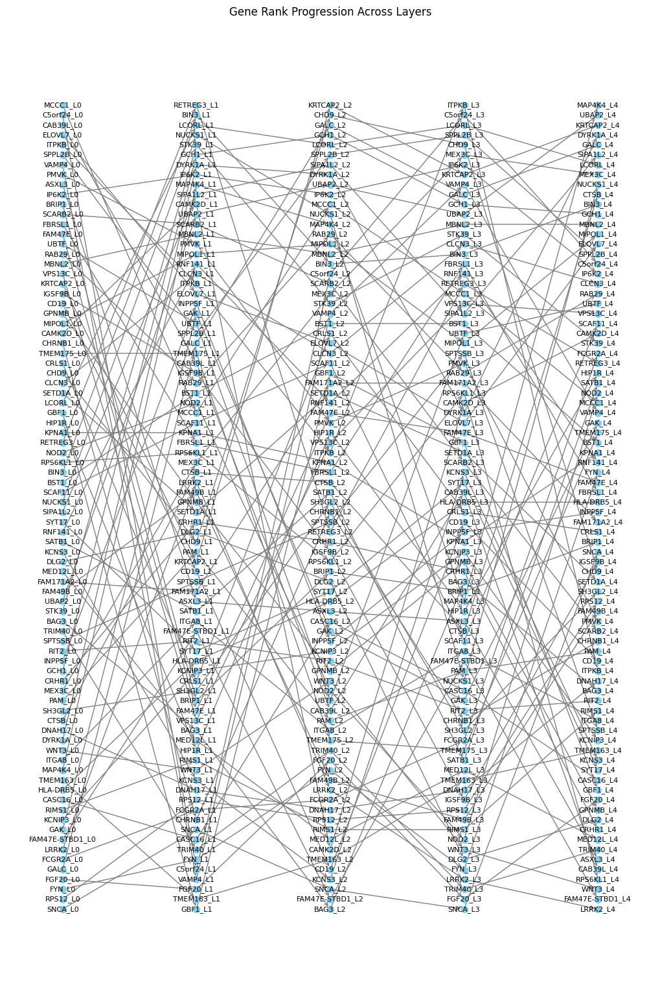

In [173]:
import matplotlib.pyplot as plt
import networkx as nx

# The rank positions for each gene across four layers
gene_ranks = rank_dict

G = nx.DiGraph()

# Number of layers
num_layers = len(next(iter(gene_ranks.values())))

# Add nodes and edges for each gene across the layers
for gene, ranks in gene_ranks.items():
    for layer in range(num_layers - 1):
        # Add nodes for the gene at each layer with unique identifiers
        current_node = f"{gene}_L{layer}"
        next_node = f"{gene}_L{layer + 1}"
        G.add_node(current_node, layer=layer, rank=ranks[layer])
        G.add_node(next_node, layer=layer + 1, rank=ranks[layer + 1])
        
        # Add a directed edge to show rank progression between layers
        G.add_edge(current_node, next_node)

# Position nodes to show each layer vertically
pos = {}
layer_spacing = 1.5  # Space between layers
rank_spacing = 0.3   # Space between ranks in a layer

for node, data in G.nodes(data=True):
    layer = data['layer']
    rank = data['rank']
    pos[node] = (layer * layer_spacing, -rank * rank_spacing)

# Draw the graph
plt.figure(figsize=(10, 15))
nx.draw(G, pos, with_labels=True, node_size=50, font_size=8, arrowstyle='->', arrowsize=10, node_color="skyblue", edge_color="gray")

plt.title("Gene Rank Progression Across Layers")
plt.xlabel("Layers")
plt.ylabel("Rank (Higher is lower on graph)")
plt.gca().invert_yaxis()  # To have higher ranks visually lower
plt.show()

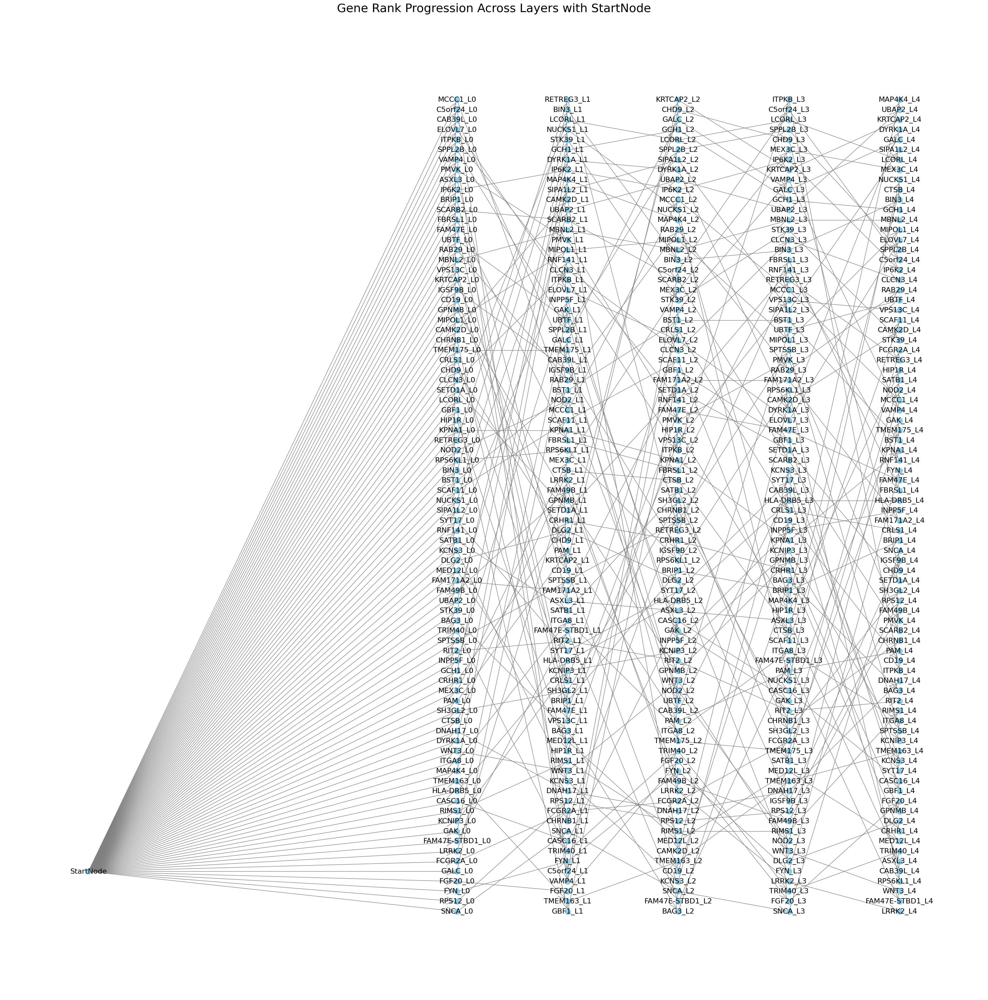

In [174]:
import matplotlib.pyplot as plt
import networkx as nx


# Create the directed graph
G = nx.DiGraph()

# Number of layers (based on the length of the rank list)
num_layers = len(next(iter(rank_dict.values())))

# Add the start node before the first layer
start_node = "StartNode"
G.add_node(start_node, layer=-1, rank=0)  # Layer -1 to indicate it's before the first layer

# Add nodes and edges for each gene across the layers
for gene, ranks in rank_dict.items():
    for layer in range(num_layers - 1):
        # Add nodes for the gene at each layer with unique identifiers
        current_node = f"{gene}_L{layer}"
        next_node = f"{gene}_L{layer + 1}"
        G.add_node(current_node, layer=layer, rank=ranks[layer])
        G.add_node(next_node, layer=layer + 1, rank=ranks[layer + 1])
        
        # Add a directed edge to show rank progression between layers
        G.add_edge(current_node, next_node)
    
    # Add edges from the start node to the first layer nodes
    first_layer_node = f"{gene}_L0"
    G.add_edge(start_node, first_layer_node)

# Position nodes to show each layer vertically
pos = {}
layer_spacing = 1.5  # Space between layers
rank_spacing = 0.3   # Space between ranks in a layer

# Set the position of the StartNode to be at the mid-left of the first layer
start_node_x_pos = -5 # Fixed position on the left
start_node_y_pos = -1.5  # Middle of first layer vertically

# Position the nodes
for node, data in G.nodes(data=True):
    layer = data['layer']
    rank = data['rank']
    
    if layer == -1:
        # Place the StartNode on the mid-left of the first layer
        pos[node] = (start_node_x_pos, start_node_y_pos)
    else:
        # Place other nodes based on their layer and rank
        pos[node] = (layer * layer_spacing, -rank * rank_spacing)

# Draw the graph
plt.figure(figsize=(30, 30))
nx.draw(G, pos, with_labels=True, node_size=150, font_size=16, arrowstyle='->', arrowsize=40, node_color="skyblue", edge_color="gray")

# Title and labels
plt.title("Gene Rank Progression Across Layers with StartNode", fontsize=26)
plt.xlabel("Layers")
plt.ylabel("Rank (Higher is lower on graph)")
plt.gca().invert_yaxis()  # To have higher ranks visually lower

# Save the plot as an SVG file
plt.savefig("gene_rank_progression_with_start_node_left.svg", format="svg")
plt.savefig("gene_rank_progression_with_start_node_left.png", format="png")
plt.savefig("smaller_plots/smaller_gene_ranked_prgression_prodromal_to_pd.png", dpi=100)

# Show the plot
plt.show()


In [177]:
!mkdir -p feature_importance_weights/lancet_genes/prodromal_vs_pd
def return_value(i):

    l = [AVG_FEATURE_IMPORTANCES_Prodromal_BL_PD_BL[i],AVG_FEATURE_IMPORTANCES_Prodromal_V02_PD_V02[i],AVG_FEATURE_IMPORTANCES_Prodromal_V04_PD_V04[i],
    AVG_FEATURE_IMPORTANCES_Prodromal_V06_PD_V06[i],AVG_FEATURE_IMPORTANCES_Prodromal_V08_PD_V08[i]]
    return l


li = []
genes = []
for i in AVG_FEATURE_IMPORTANCES_Prodromal_BL_PD_BL.keys():
    
    li.append(return_value(i))
    genes.append(i)

df = pd.DataFrame(li)
df['genes'] = genes
df = df.set_index('genes')
df.columns = ['BL','V02','V04','V06','V08']
df['Gene_Name'] =df.reset_index()['genes'].apply(return_gene_name).tolist()
df = df.set_index('Gene_Name')
df.to_csv(f'feature_importance_weights/lancet_genes/prodromal_vs_pd/prodromal_vs_pd.csv',index = True)
df


,BL,V02,V04,V06,V08
Gene_Name,,,,,
MED12L,-0.104897,-0.020873,-0.007012,-0.017918,0.001970
CHRNB1,-0.330353,-0.008844,0.098009,-0.023887,-0.013207
FAM47E-STBD1,0.014659,0.034429,0.003448,0.031075,0.000482
ASXL3,-0.510156,0.038918,-0.055787,0.042398,0.001281
HIP1R,-0.209360,0.016568,0.141309,-0.042821,0.067578
...,...,...,...,...,...
ELOVL7,-0.703282,-0.243834,-0.188498,-0.114682,-0.103674
LRRK2,-0.013638,0.095420,0.011353,-0.001752,-0.000310
SYT17,0.137890,0.033454,0.064370,0.087240,0.005069
